# Housing Project

# House Price Prediction

### Problem Statement

* Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate
 market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market
 and there are various companies working in the domain. Data science comes as a very important tool to solve problems
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling,
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing
companies. Our problem is related to one such housing company.
* A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file
below.
* The company is looking at prospective properties to buy houses to enter the market. You are required to build a model
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest
in them or not. For this company wants to know:


##### * Which variables are important to predict the price of variable?
##### * How do these variables describe the price of the house?

### Business Goal:

* You are required to model the price of houses with the available independent variables. This model will then be used
by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the
strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the
management to understand the pricing dynamics of a new market.

In [1]:
# Importing Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Displaying all columns and rows of data
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [3]:
# Importing the train data set

df_train=pd.read_csv('train.csv')
df_train.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

In [4]:
# Importing the test data set
df_test=pd.read_csv('test.csv')
df_test.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

# Exploratory Data Analysis(EDA)

In [5]:
# Checking the shape of train data

df_train.shape

(1168, 81)

In train data set there are 1168 rows and 81 columns present

In [6]:
# Checking the shape of test data
df_test.shape

(292, 80)

In test data set there 292 rows and 80 columns present

In [7]:
# Checking the columns name in train data
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [8]:
# Checking the columns name in test data
df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [9]:
# Checking the information of train data
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In train data set it contains integer, float and object data type

In [10]:
# Checking the information of test data set
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In test data set contain integer, float and object data type

In [11]:
df_train.sample(3)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
737,892,60,RL,70.0,11184,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,2Story,6,5,1978,1978,Hip,CompShg,HdBoard,HdBoard,BrkFace,92.0,TA,TA,CBlock,TA,TA,No,LwQ,226,Rec,500,192,918,GasA,Gd,Y,SBrkr,918,765,0,1683,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1978.0,RFn,2,440,TA,TA,Y,243,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,172500
656,1220,160,RM,21.0,1680,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrDale,Norm,Norm,Twnhs,2Story,6,5,1971,1971,Gable,CompShg,CemntBd,CmentBd,BrkFace,236.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,672,672,GasA,TA,Y,SBrkr,672,546,0,1218,0,0,1,1,3,1,TA,7,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,201,0,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,91500
20,259,60,RL,80.0,12435,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2001,Gable,CompShg,VinylSd,VinylSd,BrkFace,172.0,Gd,TA,PConc,Gd,TA,No,GLQ,361,Unf,0,602,963,GasA,Ex,Y,SBrkr,963,829,0,1792,0,0,2,1,3,1,Gd,7,Typ,1,TA,Attchd,2001.0,RFn,2,564,TA,TA,Y,0,96,0,245,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,231500


In [12]:
# Checking the unique value in train data
df_train.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        551
BsmtFinType2        6
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFin

In [13]:
# Checking the unique value in test data
df_test.nunique()

Id               292
MSSubClass        15
MSZoning           4
LotFrontage       65
LotArea          249
Street             2
Alley              2
LotShape           4
LandContour        4
Utilities          2
LotConfig          5
LandSlope          3
Neighborhood      24
Condition1         8
Condition2         2
BldgType           5
HouseStyle         8
OverallQual        8
OverallCond        7
YearBuilt         84
YearRemodAdd      57
RoofStyle          5
RoofMatl           3
Exterior1st       12
Exterior2nd       14
MasVnrType         4
MasVnrArea       104
ExterQual          4
ExterCond          4
Foundation         6
BsmtQual           4
BsmtCond           3
BsmtExposure       4
BsmtFinType1       6
BsmtFinSF1       184
BsmtFinType2       6
BsmtFinSF2        32
BsmtUnfSF        231
TotalBsmtSF      224
Heating            4
HeatingQC          4
CentralAir         2
Electrical         4
1stFlrSF         238
2ndFlrSF         113
LowQualFinSF       4
GrLivArea        246
BsmtFullBath 

In [14]:
# Checking the data types of train data
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [15]:
# Checking the data types of test data
df_test.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [16]:
# Dropping the unnecessary columns from train dataset

df_train=df_train.drop(columns=['Id','Alley','Utilities','MasVnrType','PoolQC','Fence','MiscFeature'],axis=1)

In [17]:
# Checking the shape after dropping the columns in train data

df_train.shape

(1168, 74)

In [18]:
# Dropping the unncessary columns in the test dataset

df_test=df_test.drop(columns=['Id','Utilities'],axis=1)

In [19]:
# Checking the shape after dropping the columns in test data
df_test.shape

(292, 78)

In [20]:
df_train.nunique()


MSSubClass        15
MSZoning           5
LotFrontage      106
LotArea          892
Street             2
LotShape           4
LandContour        4
LotConfig          5
LandSlope          3
Neighborhood      25
Condition1         9
Condition2         8
BldgType           5
HouseStyle         8
OverallQual       10
OverallCond        9
YearBuilt        110
YearRemodAdd      61
RoofStyle          6
RoofMatl           8
Exterior1st       14
Exterior2nd       15
MasVnrArea       283
ExterQual          4
ExterCond          5
Foundation         6
BsmtQual           4
BsmtCond           4
BsmtExposure       4
BsmtFinType1       6
BsmtFinSF1       551
BsmtFinType2       6
BsmtFinSF2       122
BsmtUnfSF        681
TotalBsmtSF      636
Heating            6
HeatingQC          5
CentralAir         2
Electrical         5
1stFlrSF         669
2ndFlrSF         351
LowQualFinSF      21
GrLivArea        746
BsmtFullBath       4
BsmtHalfBath       3
FullBath           4
HalfBath           3
BedroomAbvGr 

In [21]:
# Checking the count of train data
for i in df_train.columns:
    print(df_train[i].value_counts())
    print('------------------------------------')

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64
------------------------------------
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
------------------------------------
60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
65.0      35
85.0      26
90.0      20
78.0      19
73.0      16
68.0      16
24.0      16
79.0      14
64.0      14
21.0      14
55.0      13
72.0      13
51.0      13
100.0     12
59.0      12
82.0      12
71.0      11
63.0      11
74.0      11
88.0      10
69.0      10
66.0      10
53.0      10
67.0       9
34.0       9
84.0       9
43.0       8
92.0       8
52.0       8
77.0       8
76.0       8
40.0       8
95.0       7
62.0       7
86.0       7
61.0       7
57.0       7
35.0       7
96.0       6
94.0       6
120.0      6
44.0       6
54.0       6
81

In [22]:
df_train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,NaN,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000
1,20,RL,95.0,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000
2,60,RL,92.0,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790
3,20,RL,105.0,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000
4,20,RL,NaN,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000
5,60,RL,58.0,14054,Pave,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,0,11,2006,New,Partial,219210
6,20,RL,NaN,11341,Pave,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,0,5,2010,WD,Normal,121500
7,20,RL,88.0,13125,Pave,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,0,1,2006,WD,Normal,155000
8,20,RL,70.0,9170,Pave,Reg,Lvl,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,400,4,2007,WD,Normal,140000
9,50,RL,80.0,8480,Pave,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,0,0,0,10,2008,COD,Abnorml,118500


I see there are zeros present in many columns.

The zeros are frequently occur in below columns
* BsmtFinSF2
* LowQualFinSF
* EnclosedPorch
* 3SsnPorch
* ScreenPorch
* PoolArea
* MiscVal

We can removed this columns from the train data set. As it didn't contribute much.


In [23]:
# Dropping the Unncessary columns
df_train=df_train.drop(columns=['BsmtFinSF2','LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],axis=1)

In [24]:
df_test

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.0,14157,Pave,NaN,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,80,RL,NaN,12800,Pave,NaN,Reg,Low,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,Y,0,247,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal


I see there are zeros present in many columns in test data set as well.

The zeros are frequently occur in below columns
* BsmtFinSF2
* LowQualFinSF
* EnclosedPorch
* 3SsnPorch
* ScreenPorch
* PoolArea
* MiscVal

We can removed this columns from the test data set. As it didn't contribute much.

In [25]:
# Dropping the Unncessary columns
df_test=df_test.drop(columns=['BsmtFinSF2','LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],axis=1)

In [26]:
df_train.shape

(1168, 67)

In [27]:
df_test.shape

(292, 71)

In [28]:
# Checking the value count for test data
for i in df_test:
    print(df_test[i].value_counts())
    print("---------------------------------")

20     108
60      55
50      31
120     18
30      17
160     16
80      15
90      11
70       7
180      4
190      4
45       2
75       2
40       1
85       1
Name: MSSubClass, dtype: int64
---------------------------------
RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64
---------------------------------
60.0     32
85.0     14
50.0     13
70.0     12
21.0      9
80.0      9
65.0      9
75.0      7
78.0      6
52.0      6
63.0      6
64.0      5
66.0      5
57.0      5
43.0      4
74.0      4
40.0      4
100.0     4
55.0      4
72.0      4
110.0     3
76.0      3
24.0      3
79.0      3
90.0      3
48.0      3
102.0     3
67.0      3
86.0      3
44.0      3
93.0      3
68.0      3
83.0      2
51.0      2
98.0      2
47.0      2
42.0      2
92.0      2
91.0      2
73.0      2
58.0      2
32.0      2
37.0      2
96.0      2
35.0      2
62.0      2
56.0      2
107.0     2
89.0      1
120.0     1
71.0      1
150.0     1
30.0      1
36.0      1

In [29]:
# Checking the null value for train date
df_train.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrArea         7
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          30
BsmtCond          30
BsmtExposure      31
BsmtFinType1      30
BsmtFinSF1         0
BsmtFinType2      31
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual  

Null value is present in LotFrontage, FirePlaceQu, GarageType, GarageYrBlt, GarageFinish,  GarageQual, GarangeCond, BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1, BsmtFinType2, MasVnrArea.                                        

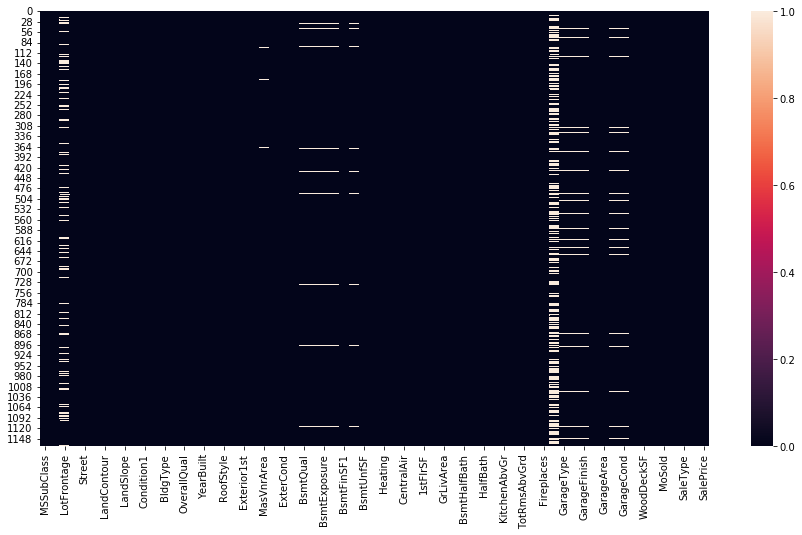

In [30]:
# Checking the null value using the heatmap
plt.figure(figsize=(15,8))
sns.heatmap(df_train.isnull())
plt.show()

In [31]:
# Checking the null value for test data set
df_test.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr 

Null value is present in most of the columns.

Null value present in below columns
* LotFrontage  
* Alley            
* MasVnrType         
* MasVnrArea         
* BsmtQual           
* BsmtCond           
* BsmtExposure       
* BsmtFinType1       
* BsmtFinType2       
* Electrical         
* FireplaceQu      
* GarageType        
* GarageYrBlt       
* GarageFinish      
* GarageQual    
* GarageCond    
* PoolQC           
* Fence            
* MiscFeature      


In [32]:
# Dropping the unnecessary columns
df_test=df_test.drop(columns=['MasVnrType','PoolQC','Fence','MiscFeature'],axis=1)

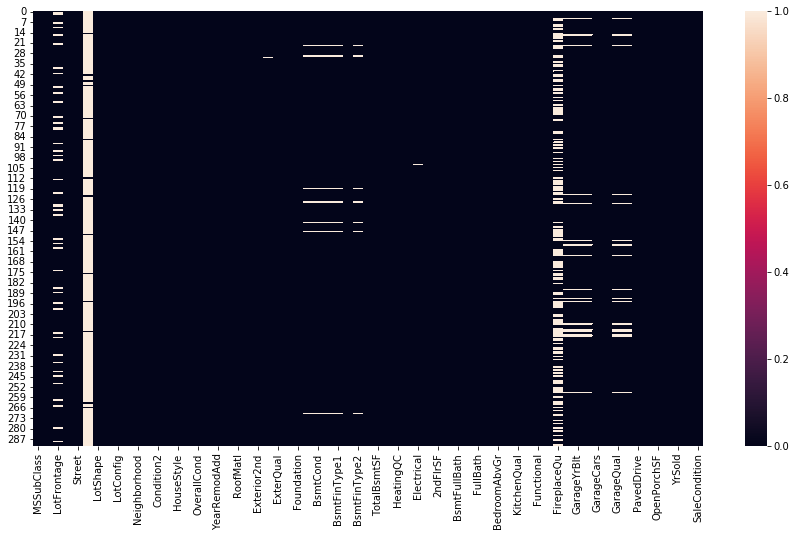

In [33]:
# Checking the null value using the heatmap
plt.figure(figsize=(15,8))
sns.heatmap(df_test.isnull())
plt.show()

In [34]:
# Checking the categorical data in the train data

categorical_trdata=[]
for i in df_train.columns:
    if (df_train[i].dtype=='object'):
        categorical_trdata.append(i)
print(categorical_trdata)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [35]:
# Checking the numerical data in the train data
numerical_trdata=[]
for i in df_train.columns:
    if (df_train[i].dtype!='object'):
        numerical_trdata.append(i)
print(numerical_trdata)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice']


In [36]:
# Replacing the null value with mode for categorical data in the train data set

categorical_trcol=df_train.columns.values
for i in range(0,len(categorical_trcol)):
    if (df_train[categorical_trcol[i]].dtype=='object'):
        df_train[categorical_trcol[i]].fillna(df_train[categorical_trcol[i]].mode()[0],inplace=True)

In [37]:
# Replacing the null value with mean for numerical data in the train data set

numerical_trcol=df_train.columns.values
for i in range(0, len(numerical_trcol)):
    if (df_train[numerical_trcol[i]].dtype!='object'):
        df_train[numerical_trcol[i]].fillna(df_train[numerical_trcol[i]].mean(),inplace=True)

In [38]:
# Checking the null value after replacing with mode and mean in the train data
df_train.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType  

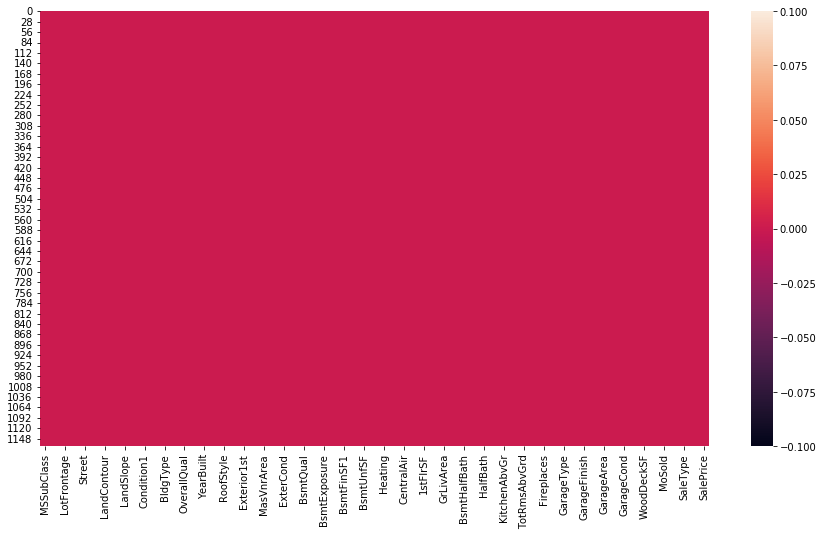

In [39]:
# Checking the null value using the heatmap
plt.figure(figsize=(15,8))
sns.heatmap(df_train.isnull())
plt.show()

There is no null value present in the train data set.

In [40]:
# Checking the categorical data for test data
categorical_tedata=[]
for i in df_test.columns:
    if (df_test[i].dtype=='object'):
        categorical_tedata.append(i)
print(categorical_tedata) 

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [41]:
# Checking the numerical data for test data
numerical_tedata=[]
for i in df_test.columns:
    if (df_test[i].dtype!='object'):
        numerical_tedata.append(i)
print(numerical_tedata)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold']


In [42]:
# Replacing the null value with mode for categorical data in the test data
categorical_tecol=df_test.columns.values
for i in range(0,len(categorical_tecol)):
    if (df_test[categorical_tecol[i]].dtype=='object'):
        df_test[categorical_tecol[i]].fillna(df_test[categorical_tecol[i]].mode()[0],inplace=True)

In [43]:
# Replacing the null value with mean for numerical data in the test data
numerical_tecol=df_test.columns.values
for i in range(0,len(numerical_tecol)):
    if (df_test[numerical_tecol[i]].dtype!='object'):
        df_test[numerical_tecol[i]].fillna(df_test[numerical_tecol[i]].mean(),inplace=True)

In [44]:
# Checking the null value after replacing with mode and mean for test data
df_test.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu 

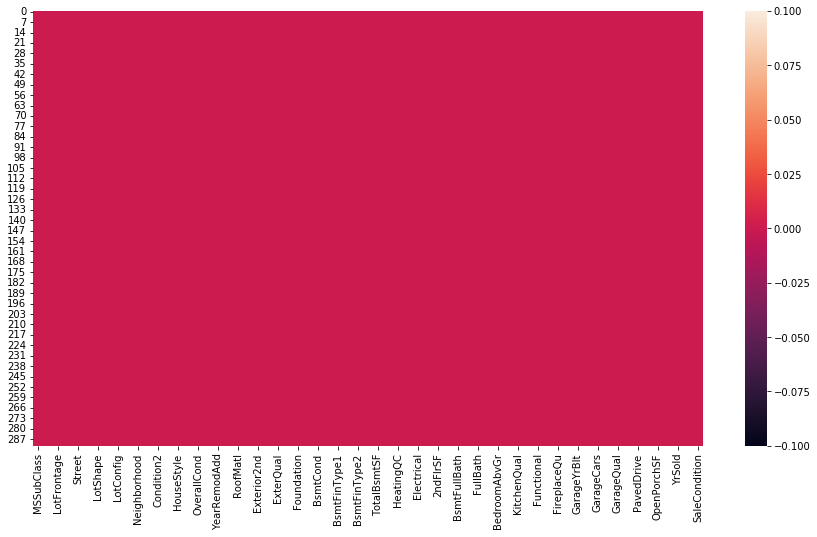

In [45]:
plt.figure(figsize=(15,8))
sns.heatmap(df_test.isnull())
plt.show()

We have replaced all the null value. There is no null value present in the test dataset.

In [46]:
df_train.sample(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1035,90,RL,65.00000,6040,Pave,Reg,Lvl,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,0,GasA,TA,N,FuseP,1152,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,Gd,Attchd,1978.193841,Unf,0,0,TA,TA,N,0,0,6,2008,WD,AdjLand,82000
779,50,RL,70.98847,13650,Pave,Reg,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1.5Fin,5,5,1958,1958,Gable,CompShg,MetalSd,MetalSd,0.0,Gd,Gd,CBlock,TA,TA,No,ALQ,57,BLQ,554,1052,GasA,Ex,Y,SBrkr,1252,668,1920,1,0,2,0,4,1,Gd,8,Typ,1,Gd,Attchd,1958.000000,Unf,2,451,TA,TA,Y,0,0,7,2006,WD,Normal,172500
639,60,RL,70.98847,18450,Pave,IR1,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,2Story,6,5,1965,1979,Flat,Tar&Grv,Plywood,Plywood,113.0,TA,Gd,CBlock,Gd,TA,No,LwQ,187,Rec,111,1021,GasA,TA,Y,SBrkr,1465,915,2380,0,0,2,1,3,1,TA,7,Sev,1,Po,CarPort,1965.000000,Unf,2,596,TA,TA,Y,0,265,8,2007,WD,Abnorml,129000


In [47]:
# Converting Year to Age in the train data set
df_train['Year_Build']=df_train['YearBuilt'].max()-df_train['YearBuilt']
df_train['Year_Remod_Add']=df_train['YearRemodAdd'].max()-df_train['YearRemodAdd']
df_train['Garage_Age']=df_train['GarageYrBlt'].max()-df_train['GarageYrBlt']
df_train['Year_Sold']=df_train['YrSold'].max()-df_train['YrSold']

In [48]:
# Dropping the columns
df_train=df_train.drop(columns=['YearBuilt','YearRemodAdd','GarageYrBlt','YrSold'],axis=1)

In [49]:
df_train.head(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_Build,Year_Remod_Add,Garage_Age,Year_Sold
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,WD,Normal,128000,34,34,33.0,3
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,WD,Normal,268000,40,40,40.0,3
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,WD,Normal,269790,14,13,13.0,3


In [50]:
df_test.head(2)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.000000,14157,Pave,Grvl,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,673,1922,GasA,Ex,Y,SBrkr,1922,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,7,2007,WD,Normal
1,120,RL,66.425101,5814,Pave,Grvl,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,184,1220,GasA,Gd,Y,SBrkr,1360,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,8,2009,COD,Abnorml


In [51]:
# Converting Year to Age in the test data set
df_test['Year_Built']=df_test['YearBuilt'].max()-df_test['YearBuilt']
df_test['Year_Remod_Add']=df_test['YearRemodAdd'].max()-df_test['YearRemodAdd']
df_test['Garage_Age']=df_test['GarageYrBlt'].max()-df_test['GarageYrBlt']
df_test['Year_Sold']=df_test['YrSold'].max()-df_test['YrSold']

In [52]:
# Dropping the columns in the test data
df_test=df_test.drop(columns=['YearBuilt','YearRemodAdd','GarageYrBlt','YrSold'],axis=1)

In [53]:
df_test.head(2)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_Built,Year_Remod_Add,Garage_Age,Year_Sold
0,20,RL,86.000000,14157,Pave,Grvl,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,Hip,CompShg,VinylSd,VinylSd,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,673,1922,GasA,Ex,Y,SBrkr,1922,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,Fin,3,676,TA,TA,Y,178,51,7,WD,Normal,4,4,5.0,3
1,120,RL,66.425101,5814,Pave,Grvl,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,184,1220,GasA,Gd,Y,SBrkr,1360,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,RFn,2,565,TA,TA,Y,63,0,8,COD,Abnorml,25,26,26.0,1


In [54]:
df_test.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars',
       'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF',
       'OpenPorchSF', 'MoSold', 'SaleType', 'SaleCondition', 'Year_Built',
       'Year_Remod_Add', 'Gar

In [55]:
# Checking the Statistical description of train data

df_train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,Year_Build,Year_Remod_Add,Garage_Age,Year_Sold
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,348.826199,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1.776541,476.860445,96.206336,46.559932,6.344178,181477.005993,39.069349,25.241438,31.806159,2.195205
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,439.696370,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,0.745554,214.466769,126.158988,66.381023,2.686352,79105.586863,30.145255,20.785185,24.198559,1.329738
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,34900.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,338.000000,0.000000,0.000000,5.000000,130375.000000,10.000000,6.000000,9.000000,1.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,24.000000,6.000000,163995.000000,38.000000,17.000000,31.806159,2.000000
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,729.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,171.000000,70.000000,8.000000,215000.000000,56.000000,44.000000,48.000000,3.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,755000.000000,135.000000,60.000000,110.000000,4.000000


In the train data set the count is equal in all columns that mean no missing value present. Mean is greater than median for the data columns.

In [56]:
# Checking the Statistical description of test data

df_test.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,Year_Built,Year_Remod_Add,Garage_Age,Year_Sold
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000
mean,57.414384,66.425101,10645.143836,6.078767,5.493151,109.171821,439.294521,557.315068,1042.767123,1133.691781,339.657534,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1.729452,457.458904,86.397260,47.061644,6.232877,36.383562,24.705479,30.240000,2.140411
std,43.780649,19.975962,13330.669795,1.356147,1.063267,174.729023,429.559675,411.043768,424.561153,366.941919,424.278825,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,0.754430,210.785591,121.898836,65.865449,2.774556,30.447016,20.105792,23.161183,1.322867
min,20.000000,21.000000,1526.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,57.750000,7200.000000,5.000000,5.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,1061.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1.000000,300.000000,0.000000,0.000000,4.000000,8.000000,6.750000,8.000000,1.000000
50%,50.000000,66.425101,9200.000000,6.000000,5.000000,0.000000,369.500000,487.000000,971.000000,1047.500000,0.000000,1440.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,2.000000,467.500000,0.000000,28.500000,6.000000,33.000000,16.000000,30.240000,2.000000
75%,70.000000,76.000000,11658.750000,7.000000,6.000000,180.000000,700.500000,780.000000,1322.000000,1370.500000,717.000000,1720.250000,1.000000,0.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2.000000,569.750000,149.250000,66.000000,8.000000,55.000000,42.000000,45.000000,3.000000
max,190.000000,150.000000,215245.000000,10.000000,9.000000,1031.000000,1767.000000,1935.000000,3094.000000,2402.000000,1589.000000,3447.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,4.000000,1052.000000,728.000000,418.000000,12.000000,137.000000,60.000000,94.000000,4.000000


In the test data set the count is equal in all columns that mean no missing value present. Mean is greater than median for the data columns.

In [57]:
# Checking the categorical data for train data set

categorical_col=[]
for i in df_train.dtypes.index:
    if df_train[i].dtypes=='object':
        categorical_col.append(i)
print(categorical_col)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [58]:
# Checking the numerical data for train data set

numerical_col=[]
for i in df_train.dtypes.index:
    if df_train[i].dtypes!='object':
        numerical_col.append(i)
print(numerical_col)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'SalePrice', 'Year_Build', 'Year_Remod_Add', 'Garage_Age', 'Year_Sold']


In [59]:
# Checking the categorical data for test data

categorical_col1=[]
for i in df_test.dtypes.index:
    if df_test[i].dtypes=='object':
        categorical_col1.append(i)
print(categorical_col1)

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [60]:
# Checking the numerical data for test data

numerical_col1=[]
for i in df_test.dtypes.index:
    if df_test[i].dtypes!='object':
        numerical_col1.append(i)
print(numerical_col1)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'Year_Built', 'Year_Remod_Add', 'Garage_Age', 'Year_Sold']


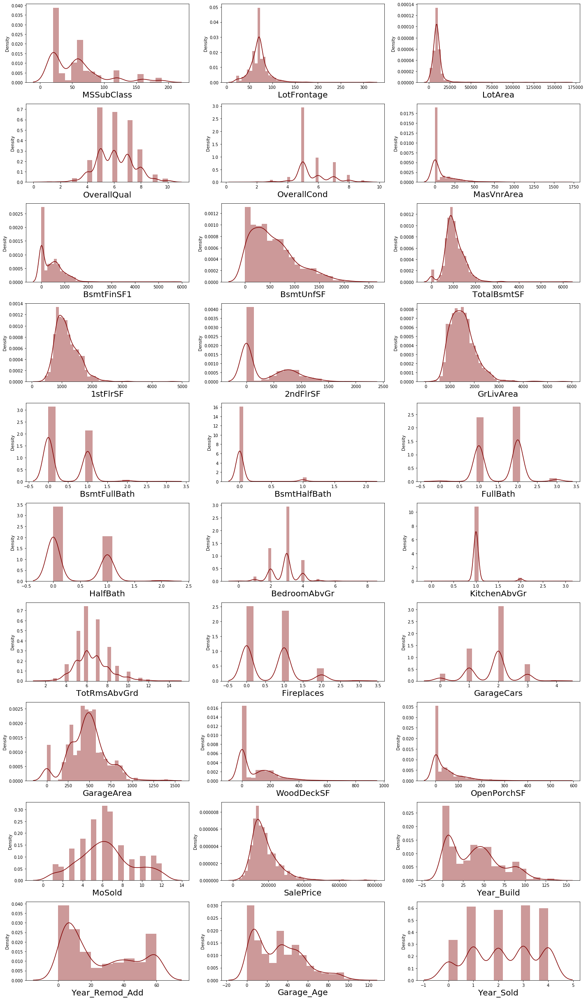

In [61]:
# Viewing the distribution plot for  numberical column in the train data set
plt.figure(figsize=(20,40))
plot_number=1
for i in df_train[numerical_col]:
    if plot_number <=35:
        ax=plt.subplot(12,3,plot_number)
        sns.distplot(df_train[i],color='maroon')
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()
            

We see that there is a skewness present in all the columns in the train data set

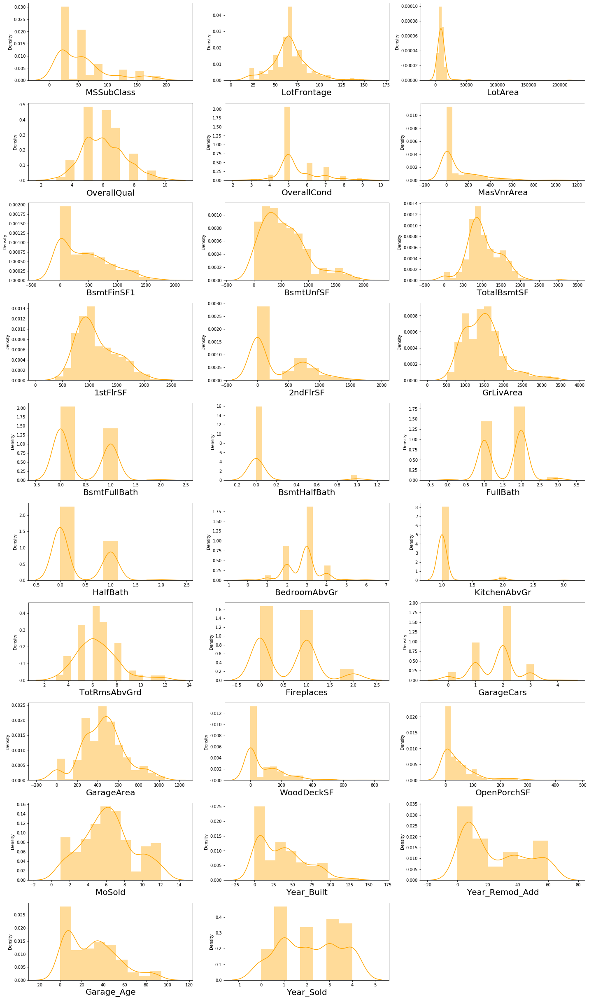

In [62]:
# Viewing the distribution plot for test data set

plt.figure(figsize=(20,40))
plot_number=1
for i in df_test[numerical_col1]:
    if plot_number<=35:
        ax=plt.subplot(12,3,plot_number)
        sns.distplot(df_test[i],color='orange')
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()

We see that there is skewness present in all the columns in the test data set

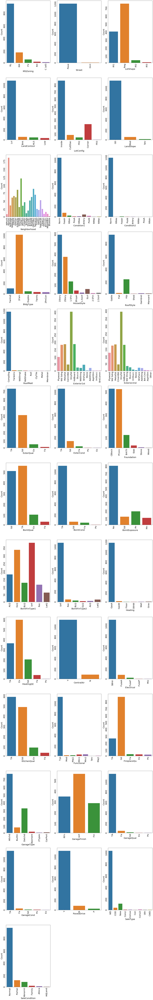

In [63]:
# Viewing the categorical data of train data using the count plot
plt.figure(figsize=(20,130))
plot_number=1
for i in df_train[categorical_col]:
    if plot_number<=40:
        ax=plt.subplot(13,3,plot_number)
        sns.countplot(df_train[i])
        plt.xticks(rotation=90,fontsize=20)
        plt.yticks(rotation=90,fontsize=20)
        plt.xlabel(i,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plot_number+=1
plt.tight_layout()

Here is the count of all the feature in the train data.
* Residential Low Density count is high as compare to other MSZoning
* In the Stree Pave count is high, in increase of sales it also depends on the type of street
* In the general shape of the property, the regural shape has the maximum count, Single Regular count is also little high next to regular shape.
* If we see the flatness of the property, the property which is having the Near Flat level has maximum count. In the Depression flatness of propery has very less count.
* In the lot configuration, inside lot configuration has the maximum count.
* In the slope of propety, the gentle slope has the maximum count.
* In the Neighborhood: Physical locations within Ames city limits, NAMES has the maximum count as compare to others.
* In Condition1, proximity to various condition the normal condition has the maximum count. Many people to have normal proximity condition. So, its count is high.
* In Condition2,  Proximity to various conditions (if more than one is present) also people prefer the normal condition. So, it has the maximum count.
* In BldgType, the type of dwelling, 1 Farm-Single Family Detached has the maximum count.
For Vinyl Siding exterior-2 covering on house has maximum counts for the feature Exterior covering on house (if more than one material)(Exterior2nd).
* For Masonry veneer type(MasVnrType) None has maximum count.
* For Typical/Average(TA) quality of the material on the exterior has maximum count, for the feature Evaluates the quality of the material on the exterior (ExterQual).
* For Typical/Average(TA) condition of the material on the exterior has maximum count for the feature Evaluates the present condition of the material on the exterior(ExterCond).
* For Cinder Block and Poured Contrete foundations the count is maximum for the feature Type of foundation(Foundation).
* For good and average quality heights of the basement the count is high for the feature Evaluates the height of the basement(BsmtQual).
* For Typical/Average(TA) general condition of the basement the count is high for the feature Evaluates the general condition of the basement(BsmtCond)
* For No Exposure garden level walls the count is maximum for the feature Refers to walkout or garden level walls(BsmtExposure).
* For unfinished Rating of basement finished area-1 the count is maximum for the feature Rating of basement finished area(BsmtFinType1).
* For unfinished Rating of basement finished area-2 the count is maximum for the feature Rating of basement finished area (if multiple types)(BsmtFinType2).
* For Gas forced warm air furnace type of heating the count is maximum for the feature Type of heating(Heating).
* For Excellent Heating quality and condition the count is high for the feature Heating quality and condition(HeatingQC).
* For Central air conditioning-yes has maximum count for the feature Central air conditioning(CentralAir).
* For Standard Circuit Breakers & Romex Electrical system the count is high for the feature Electrical system(Electrical).
* For Typical/Average(TA) and good Kitchen quality the count is maximum for the feature Kitchen quality(KitchenQual).
* Typical Functionality has highest count for Home functionality (Assume typical unless deductions are warranted)(Functional).
* For good Fireplace quality the count is high for the feature Fireplace quality(FireplaceQu).
* If Garage location Attached to home then the count is high, for the feature Garage location(GarageType).
* For Unfinished Interior of the garage the count is maximum, for the feature Interior finish of the garage(GarageFinish).
* For Typical/Average(TA) Garage quality the count is high, for the feature Garage quality(GarageQual).
* For Typical/Average(TA) Garage condition the count is high, for the feature Garage condition(GarageCond).
* For Paved driveway the count is maximum, for the feature Paved driveway(PavedDrive).
* For Warranty Deed - Conventional type of sales the count is maximum, for the feature Type of sale(SaleType).
* For Normal sales condition the count is high, for the feature Condition of sale(SaleCondition).


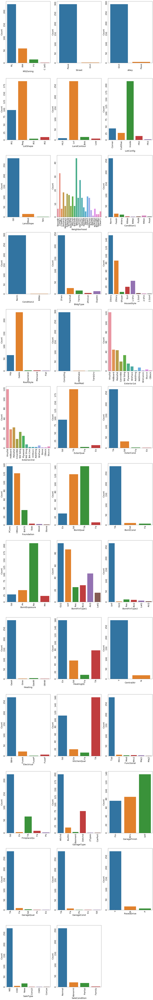

In [64]:
# Viewing the categorical data of test data using the count plot
plt.figure(figsize=(20,130))
plot_number=1
for i in df_test[categorical_col1]:
    if plot_number<=40:
        ax=plt.subplot(13,3,plot_number)
        sns.countplot(df_test[i])
        plt.xticks(rotation=90,fontsize=20)
        plt.yticks(rotation=90,fontsize=20)
        plt.xlabel(i,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plot_number+=1
plt.tight_layout()

Here is the count of all the feature in the test data.
* Residential Low Density count is high as compare to other MSZoning
* In the Stree Pave count is high, in increase of sales it also depends on the type of street
* In the general shape of the property, the regural shape has the maximum count, Single Regular count is also little high next to regular shape.
* If we see the flatness of the property, the property which is having the Near Flat level has maximum count. In the Depression flatness of propery has very less count.
* In the lot configuration, inside lot configuration has the maximum count.
* In the slope of propety, the gentle slope has the maximum count.
* In the Neighborhood: Physical locations within Ames city limits, NAMES has the maximum count as compare to others.
* In Condition1, proximity to various condition the normal condition has the maximum count. Many people to have normal proximity condition. So, its count is high.
* In Condition2,  Proximity to various conditions (if more than one is present) also people prefer the normal condition. So, it has the maximum count.
* In BldgType, the type of dwelling, 1 Farm-Single Family Detached has the maximum count.
For Vinyl Siding exterior-2 covering on house has maximum counts for the feature Exterior covering on house (if more than one material)(Exterior2nd).
* For Masonry veneer type(MasVnrType) None has maximum count.
* For Typical/Average(TA) quality of the material on the exterior has maximum count, for the feature Evaluates the quality of the material on the exterior (ExterQual).
* For Typical/Average(TA) condition of the material on the exterior has maximum count for the feature Evaluates the present condition of the material on the exterior(ExterCond).
* For Cinder Block and Poured Contrete foundations the count is maximum for the feature Type of foundation(Foundation).
* For good and average quality heights of the basement the count is high for the feature Evaluates the height of the basement(BsmtQual).
* For Typical/Average(TA) general condition of the basement the count is high for the feature Evaluates the general condition of the basement(BsmtCond)
* For No Exposure garden level walls the count is maximum for the feature Refers to walkout or garden level walls(BsmtExposure).
* For unfinished Rating of basement finished area-1 the count is maximum for the feature Rating of basement finished area(BsmtFinType1).
* For unfinished Rating of basement finished area-2 the count is maximum for the feature Rating of basement finished area (if multiple types)(BsmtFinType2).
* For Gas forced warm air furnace type of heating the count is maximum for the feature Type of heating(Heating).
* For Excellent Heating quality and condition the count is high for the feature Heating quality and condition(HeatingQC).
* For Central air conditioning-yes has maximum count for the feature Central air conditioning(CentralAir).
* For Standard Circuit Breakers & Romex Electrical system the count is high for the feature Electrical system(Electrical).
* For Typical/Average(TA) and good Kitchen quality the count is maximum for the feature Kitchen quality(KitchenQual).
* Typical Functionality has highest count for Home functionality (Assume typical unless deductions are warranted)(Functional).
* For good Fireplace quality the count is high for the feature Fireplace quality(FireplaceQu).
* If Garage location Attached to home then the count is high, for the feature Garage location(GarageType).
* For Unfinished Interior of the garage the count is maximum, for the feature Interior finish of the garage(GarageFinish).
* For Typical/Average(TA) Garage quality the count is high, for the feature Garage quality(GarageQual).
* For Typical/Average(TA) Garage condition the count is high, for the feature Garage condition(GarageCond).
* For Paved driveway the count is maximum, for the feature Paved driveway(PavedDrive).
* For Warranty Deed - Conventional type of sales the count is maximum, for the feature Type of sale(SaleType).
* For Normal sales condition the count is high, for the feature Condition of sale(SaleCondition).


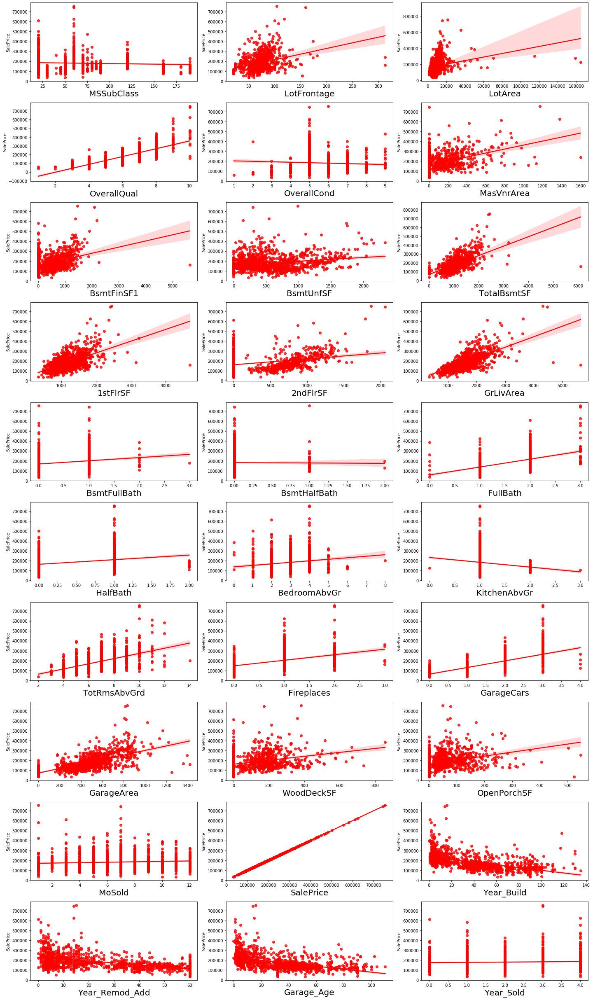

In [65]:
# Visualizing the regression plot for numerical columns in the train data set.
plt.figure(figsize=(20,40))
plot_number=1
for i in df_train[numerical_col]:
    if plot_number <=35:
        ax=plt.subplot(12,3,plot_number)
        sns.regplot(x=df_train[i],y=df_train['SalePrice'],color='red')
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()

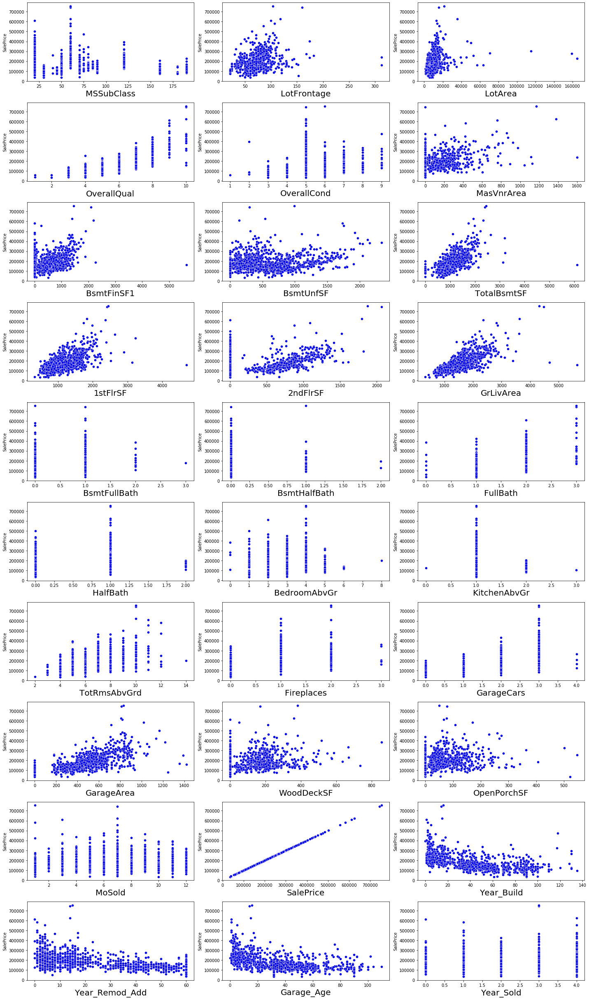

In [66]:
# Visualizing the data using scatterplot
plt.figure(figsize=(20,40))
plot_number=1
for i in df_train[numerical_col]:
    if plot_number <=35:
        ax=plt.subplot(12,3,plot_number)
        sns.scatterplot(x=df_train[i],y=df_train['SalePrice'],color='blue')
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()

# Outliers

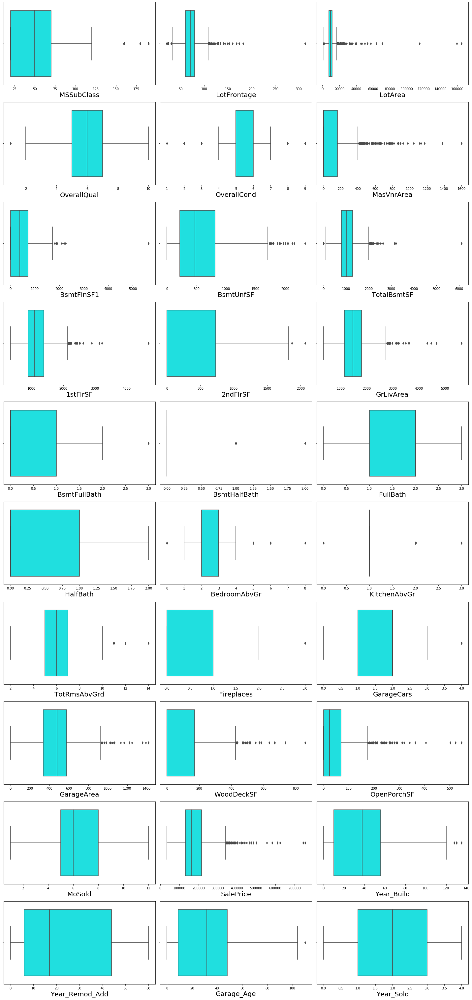

In [67]:
# Checking the outliers present in train data
plt.figure(figsize=(20,50))
plot_number=1
for i in df_train[numerical_col]:
    if plot_number<=35:
        ax=plt.subplot(12,3,plot_number)
        sns.boxplot(df_train[i],color='aqua')
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()

 Outliers are present in below columns. Sales price is our target variable, so we can ignore it.

* MSSubClass
* LotFrontage
* LotArea
* OverallQual
* OverallCond
* MasVnrArea
* BsmtFinSF1
* BsmtUnfSF
* TotalBsmtSF
* 1stFlrSF
* 2ndFlrSF
* GrLivArea
* BsmtFullBath
* BsmtHalfBath
* BedroomAbvGr
* KitchenAbvGr
* TotRmsAbvGrd
* Fireplaces
* GarageCars
* GarageArea
* WoodDeckSF
* OpenPorchSF
* Year_Build
* Garage_Age
* SalePrice


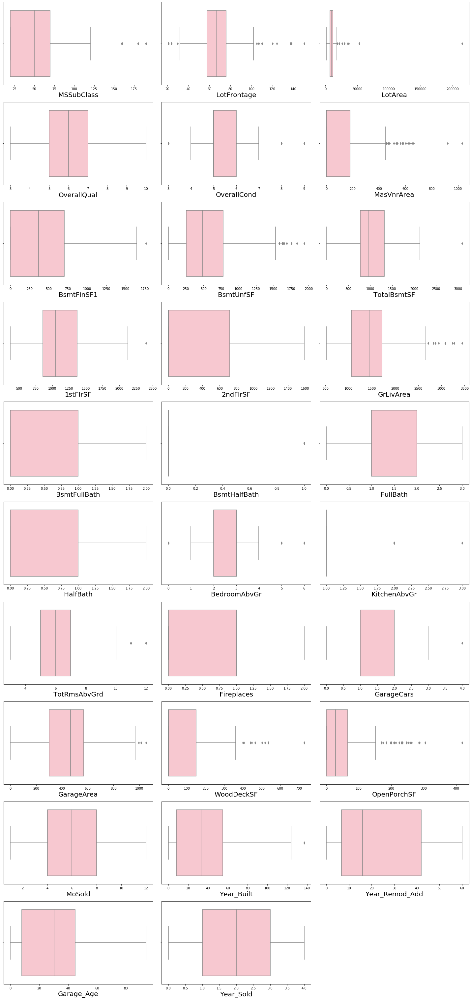

In [68]:
# Checking the outliers present in test data
plt.figure(figsize=(20,50))
plot_number=1
for i in df_test[numerical_col1]:
    if plot_number<=35:
        ax=plt.subplot(12,3,plot_number)
        sns.boxplot(df_test[i],color='pink')
        plt.xlabel(i,fontsize=20)
    plot_number+=1
plt.tight_layout()

 Outliers are present in below Columns for test data set
    
* MSSubClass
* LotFrontage
* LotArea
* OverallCond
* MasVnrArea
* BsmtFinSF1
* BsmtUnfSF
* TotalBsmtSF
* 1stFlrSF
* GrLivArea
* BsmtHalfBath
* BedroomAbvGr
* KitchenAbvGr
* TotRmsAbvGrd
* GarageCars
* GarageArea
* WoodDeckSF
* OpenPorchSF
* Year_Built

# Outliers Removal for train data

In [69]:
cols_features=df_train[['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtFullBath','BsmtHalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','Year_Build','Garage_Age']]

In [70]:
# Removing the outliers using the zscore method

from scipy.stats import zscore

z=np.abs(zscore(cols_features))
z

array([[0.        , 0.62061571, 0.56223842, ..., 2.38785016, 0.16823612,
        0.04935633],
       [1.07063136, 0.60090318, 0.56223842, ..., 2.41799216, 0.03088544,
        0.33875365],
       [0.93686671, 0.06307504, 0.56223842, ..., 1.25752521, 0.83197465,
        0.77749319],
       ...,
       [2.09513215, 0.91636244, 0.56223842, ..., 0.70170469, 0.16823612,
        0.0906988 ],
       [0.93583847, 0.22167034, 0.56223842, ..., 0.11212927, 1.69023175,
        2.40587744],
       [0.        , 0.29303823, 0.56223842, ..., 0.42862025, 1.0310962 ,
        0.98420557]])

In [71]:
df_newtr=df_train[(z<3).all(axis=1)]
df_newtr.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_Build,Year_Remod_Add,Garage_Age,Year_Sold
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,WD,Normal,128000,34,34,33.0,3
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,WD,Normal,268000,40,40,40.0,3
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,WD,Normal,269790,14,13,13.0,3
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,1139,1844,GasA,Ex,Y,SBrkr,1844,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,COD,Normal,190000,33,33,33.0,0
5,60,RL,58.00000,14054,Pave,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,879,879,GasA,Ex,Y,SBrkr,879,984,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,660,TA,TA,Y,100,17,11,New,Partial,219210,4,4,4.0,4
6,20,RL,70.98847,11341,Pave,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,Hip,CompShg,Wd Sdng,Wd Sdng,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,90,1392,GasA,TA,Y,SBrkr,1392,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,Unf,2,528,TA,TA,Y,0,0,5,WD,Normal,121500,53,14,53.0,0
7,20,RL,88.00000,13125,Pave,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,Gable,CompShg,Wd Sdng,Wd Sdng,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,284,1134,GasA,Ex,Y,SBrkr,1803,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,RFn,2,484,TA,TA,Y,0,0,1,WD,Normal,155000,53,10,53.0,4
8,20,RL,70.00000,9170,Pave,Reg,Lvl,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,Hip,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,420,1214,GasA,Ex,Y,SBrkr,1214,0,1214,1,0,1,0,2,1,TA,6,Typ,0,Gd,Detchd,Unf,2,461,Fa,Fa,Y,0,0,4,WD,Normal,140000,45,45,45.0,3
9,50,RL,80.00000,8480,Pave,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,390,832,GasA,TA,Y,SBrkr,832,384,1216,0,0,1,0,2,1,TA,6,Typ,0,Gd,Detchd,Unf,1,336,TA,TA,Y,158,0,10,COD,Abnorml,118500,63,60,63.0,2
10,50,RM,50.00000,8600,Pave,Reg,Bnk,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1.5Fin,6,6,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,780,780,GasA,TA,Y,SBrkr,780,596,1376,0,0,2,0,3,1,TA,7,Typ,1,Gd,Detchd,Unf,1,198,TA,TA,N,0,0,6,WD,Normal,119500,73,60,73.0,4


In [72]:
df_train.shape # Checking the shape of train data before outlier remove

(1168, 67)

In [73]:
df_newtr.shape # Checking the shape of train data after removal of outliers

(953, 67)

In [74]:
# Checking the loss of data in the outliers removal process
data_loss=((1168-953)/1168) 
data_loss*100

18.40753424657534

18% of outliers data have been successfully removed from the train data set.

# Outliers removal for test data

In [75]:
cols_feature=df_test[['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','GrLivArea','BsmtHalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','Year_Built']]

In [76]:
# Removing the outliers using zscore method

z_te=np.abs(zscore(cols_feature))
z_te

array([[0.98160499, 0.2638941 , 0.52071548, ..., 0.75275532, 0.05989661,
        1.06542974],
       [0.        , 0.36303034, 0.62587908, ..., 0.19226949, 0.71573848,
        0.37452289],
       [0.        , 0.08963571, 0.62587908, ..., 0.9499779 , 1.58074974,
        0.93382843],
       ...,
       [0.        , 0.04477488, 0.40605602, ..., 0.70997874, 0.71573848,
        0.08608167],
       [0.8236549 , 0.42419737, 0.62587908, ..., 0.70997874, 0.35073373,
        0.84278917],
       [2.27789203, 0.65316043, 1.71317382, ..., 0.11831103, 0.71573848,
        0.0126193 ]])

In [77]:
df_newte=df_test[(z_te<3).all(axis=1)]
df_newte.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_Built,Year_Remod_Add,Garage_Age,Year_Sold
0,20,RL,86.000000,14157,Pave,Grvl,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,Hip,CompShg,VinylSd,VinylSd,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,673,1922,GasA,Ex,Y,SBrkr,1922,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,Fin,3,676,TA,TA,Y,178,51,7,WD,Normal,4,4,5.00,3
1,120,RL,66.425101,5814,Pave,Grvl,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,184,1220,GasA,Gd,Y,SBrkr,1360,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,RFn,2,565,TA,TA,Y,63,0,8,COD,Abnorml,25,26,26.00,1
2,20,RL,66.425101,11838,Pave,Grvl,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,Hip,CompShg,VinylSd,VinylSd,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,1753,1753,GasA,Ex,Y,SBrkr,1788,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,RFn,2,522,TA,TA,Y,202,151,6,WD,Normal,8,9,9.00,1
3,70,RL,75.000000,12000,Pave,Grvl,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,429,704,GasA,Ex,Y,SBrkr,860,704,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,Unf,1,234,TA,TA,Y,0,0,7,WD,Normal,68,60,69.00,1
4,60,RL,86.000000,14598,Pave,Grvl,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,Gable,CompShg,VinylSd,VinylSd,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,894,894,GasA,Ex,Y,SBrkr,894,1039,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,668,TA,TA,Y,100,18,1,WD,Normal,2,3,3.00,2
5,180,RM,21.000000,1936,Pave,Grvl,Reg,Lvl,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,Gable,CompShg,CemntBd,CmentBd,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,0,630,GasA,Gd,Y,SBrkr,630,0,630,1,0,1,0,1,1,TA,3,Typ,0,Gd,Attchd,Unf,0,0,TA,TA,Y,0,0,12,WD,Normal,39,40,30.24,3
6,180,RM,35.000000,3675,Pave,Grvl,Reg,Lvl,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,Gable,CompShg,VinylSd,VinylSd,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,547,GasA,Gd,Y,SBrkr,1072,0,1072,1,0,1,0,2,1,TA,5,Typ,0,Gd,Basment,Fin,2,525,TA,TA,Y,0,28,5,WD,Normal,4,5,5.00,4
7,20,RL,107.000000,13891,Pave,Grvl,Reg,Lvl,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,Hip,CompShg,VinylSd,VinylSd,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,310,1710,GasA,Ex,Y,SBrkr,1710,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,RFn,3,866,TA,TA,Y,0,102,1,New,Partial,2,2,3.00,2
10,30,RM,60.000000,6324,Pave,Grvl,IR1,Lvl,Inside,Gtl,BrkSide,Feedr,RRNn,1Fam,1Story,4,6,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,520,520,GasA,Fa,N,SBrkr,520,0,520,0,0,1,0,1,1,Fa,4,Typ,0,Gd,Detchd,Unf,1,240,Fa,TA,Y,49,0,5,WD,Normal,82,60,90.00,2
11,20,RL,66.425101,9503,Pave,Grvl,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,Hip,CompShg,HdBoard,HdBoard,0.0,TA,TA,CBlock,TA,TA,No,ALQ,457,Rec,193,1024,GasA,TA,Y,SBrkr,1344,0,1344,1,0,1,0,2,1,TA,6,Min1,1,TA,Detchd,Unf,1,484,TA,TA,Y,316,28,6,WD,Normal,51,27,40.00,3


In [78]:
df_test.shape  # Checking the shape of test data before removing the outliers

(292, 67)

In [79]:
df_newte.shape # Checking the shape of test data after removing the outliers

(235, 67)

In [80]:
# Checking the data loss in the outliers removal process.
data_loss=((292-235)/292)
data_loss*100

19.52054794520548

19% of test data has been successfully removed from the test data set.

# Skewness

In [81]:
# Checking the skewness for train data
df_train.skew()

MSSubClass         1.422019
LotFrontage        2.710383
LotArea           10.659285
OverallQual        0.175082
OverallCond        0.580714
MasVnrArea         2.834658
BsmtFinSF1         1.871606
BsmtUnfSF          0.909057
TotalBsmtSF        1.744591
1stFlrSF           1.513707
2ndFlrSF           0.823479
GrLivArea          1.449952
BsmtFullBath       0.627106
BsmtHalfBath       4.264403
FullBath           0.057809
HalfBath           0.656492
BedroomAbvGr       0.243855
KitchenAbvGr       4.365259
TotRmsAbvGrd       0.644657
Fireplaces         0.671966
GarageCars        -0.358556
GarageArea         0.189665
WoodDeckSF         1.504929
OpenPorchSF        2.410840
MoSold             0.220979
SalePrice          1.953878
Year_Build         0.579204
Year_Remod_Add     0.495864
Garage_Age         0.662934
Year_Sold         -0.115765
dtype: float64

We will consider the skewness whose value is more than -0.5 and +0.5

Skewness present in below columns.

* MSSubClass
* LotArea
* OverallCond
* MasVnrArea
* BsmtFinSF1
* BsmtUnfSF
* 1stFlrSF
* 2ndFlrSF
* GrLivArea
* BsmtHalfBath
* HalfBath
* KitchenAbvGr
* Fireplaces
* WoodDeckSF
* OpenPorchSF
* SalePrice
* GarageAge

Sales price is our target variable. So, don't remove the skewness in Sale Price Column.

In [82]:
# Removing the skewness that present in train data

from sklearn.preprocessing import PowerTransformer

scaled=PowerTransformer(method='yeo-johnson')
scaled

PowerTransformer()

In [83]:
featurestr=['LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtHalfBath','HalfBath','Fireplaces','WoodDeckSF','OpenPorchSF']


In [84]:
df_train[featurestr]=scaled.fit_transform(df_train[featurestr].values)
df_train[featurestr]

,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtHalfBath,HalfBath,Fireplaces,WoodDeckSF,OpenPorchSF
0,-1.213954,-0.822734,-0.112649,0.903777,-0.458345,-0.871745,-1.236502,-0.238775,-0.782707,0.777879,-0.959773,1.409990
1,1.100521,-0.822734,0.394677,1.027313,2.122554,-0.871745,1.295050,-0.238775,-0.782707,0.777879,0.781991,1.414498
2,0.158048,-0.822734,0.925416,-0.504500,0.058641,1.176207,1.003880,-0.238775,1.268421,0.777879,1.043999,1.198911
3,0.496002,1.382984,0.797133,1.160517,1.574554,-0.871745,0.739356,-0.238775,-0.782707,0.777879,-0.959773,1.169545
4,1.196626,1.138552,1.176115,-0.226633,1.149105,-0.871745,0.314931,4.188040,-0.782707,0.777879,1.135369,-1.061392
5,0.855555,-0.822734,-1.347679,0.783582,-0.735659,1.195992,0.770280,-0.238775,1.268421,0.777879,0.852307,0.275826
6,0.424957,1.211377,1.207441,-1.139284,0.718084,-0.871745,-0.109011,-0.238775,1.268421,0.777879,-0.959773,-1.061392
7,0.717859,0.994089,0.033227,-0.419477,1.506962,-0.871745,0.671524,-0.238775,-0.782707,0.777879,-0.959773,-1.061392
8,0.001967,-0.822734,0.790917,-0.072115,0.292451,-0.871745,-0.521850,-0.238775,-0.782707,-1.028333,-0.959773,-1.061392
9,-0.152859,-0.822734,0.520753,-0.142851,-0.913990,1.008871,-0.516883,-0.238775,-0.782707,-1.028333,1.002061,-1.061392


In [85]:
df_train[featurestr].skew()

LotArea         0.032509
MasVnrArea      0.416370
BsmtFinSF1     -0.404528
BsmtUnfSF      -0.284390
1stFlrSF       -0.002391
2ndFlrSF        0.280208
GrLivArea      -0.000054
BsmtHalfBath    3.954345
HalfBath        0.498003
Fireplaces      0.084950
WoodDeckSF      0.113026
OpenPorchSF    -0.002749
dtype: float64

We have removed the skewness from train data

In [86]:
# Let's remove the column Garage_Age and KitchenAbvGr

df_train=df_train.drop(columns=['Garage_Age','KitchenAbvGr'],axis=1)

In [87]:
# Checking the skewness for test data

df_test.skew()

MSSubClass         1.358597
LotFrontage        0.466813
LotArea           12.781805
OverallQual        0.397312
OverallCond        1.209714
MasVnrArea         1.976804
BsmtFinSF1         0.739790
BsmtUnfSF          0.960708
TotalBsmtSF        0.519257
1stFlrSF           0.692047
2ndFlrSF           0.765511
GrLivArea          1.010586
BsmtFullBath       0.463685
BsmtHalfBath       3.544994
FullBath          -0.049800
HalfBath           0.758892
BedroomAbvGr       0.075315
KitchenAbvGr       4.849432
TotRmsAbvGrd       0.805535
Fireplaces         0.540164
GarageCars        -0.280324
GarageArea         0.133547
WoodDeckSF         1.708221
OpenPorchSF        2.185030
MoSold             0.186504
Year_Built         0.755233
Year_Remod_Add     0.535600
Garage_Age         0.683042
Year_Sold         -0.018412
dtype: float64

In [88]:
# Removing the unnecessary columns

df_test=df_test.drop(columns=['Garage_Age','KitchenAbvGr'],axis=1)

In [89]:
featureste=['LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtHalfBath','HalfBath','TotRmsAbvGrd','Fireplaces','WoodDeckSF','OpenPorchSF','Year_Built']


In [90]:
scaled_te=PowerTransformer(method='yeo-johnson')
scaled_te

PowerTransformer()

In [91]:
df_test[featureste]=scaled_te.fit_transform(df_test[featureste].values)

In [92]:
df_test[featureste].skew()

LotArea         0.003111
MasVnrArea      0.363253
BsmtFinSF1     -0.441605
BsmtUnfSF      -0.232099
1stFlrSF       -0.000548
2ndFlrSF        0.284246
GrLivArea      -0.000307
BsmtHalfBath    3.544994
HalfBath        0.621093
TotRmsAbvGrd   -0.000469
Fireplaces      0.076669
WoodDeckSF      0.210102
OpenPorchSF    -0.058951
Year_Built     -0.147007
dtype: float64

# Converting Categorical data to Numerical data using Ordinal Encoder

In [93]:
df_train.dtypescolumn = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in df_train.columns:
    df_train[i] = df_train[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [94]:
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in df_test.columns:
    df_test[i] = df_test[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [97]:
categorical_trcol=[]
for i in df_train.dtypes.index:
    if df_train[i].dtypes=='object':
        categorical_trcol.append(i)
print(categorical_trcol)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'Foundation', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageType', 'GarageFinish', 'PavedDrive', 'SaleType', 'SaleCondition']


In [101]:
from sklearn.preprocessing import LabelEncoder

In [110]:
LE=LabelEncoder()

In [111]:
# Converting the categorical data to numerical data for the train data
categorical_col=df_train.select_dtypes(exclude=['float64','int64','int32'])
for i in categorical_col:
    df_train[i]=LE.fit_transform(df_train[i].astype(str))

In [114]:
df_train.head(10) # Successfully converted the categorical data to numerical data of train data

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_Build,Year_Remod_Add,Year_Sold
0,120,3.0,70.98847,-1.213954,1.0,0.0,3.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1.0,1.0,8.0,9.0,-0.822734,3,3,1.0,4,3,3,0,-0.112649,5,0.903777,1078,1,3,1,4,-0.458345,-0.871745,-1.236502,0,-0.238775,2,-0.782707,2,3,5,6,0.777879,3,1,1,2,440,3,3,2,-0.959773,1.409990,2,8,4,128000,34,34,3
1,20,3.0,95.00000,1.100521,1.0,0.0,3.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,0.0,5.0,12.0,13.0,-0.822734,4,4,2.0,3,4,0,0,0.394677,4,1.027313,2217,1,5,1,4,2.122554,-0.871745,1.295050,1,-0.238775,2,-0.782707,4,4,8,6,0.777879,3,1,2,2,621,3,3,2,0.781991,1.414498,10,8,4,268000,40,40,3
2,60,3.0,92.00000,0.158048,1.0,0.0,3.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1.0,1.0,7.0,7.0,-0.822734,4,3,2.0,4,3,1,2,0.925416,5,-0.504500,1117,1,5,1,4,0.058641,1.176207,1.003880,1,-0.238775,2,1.268421,3,3,8,6,0.777879,3,1,2,2,455,3,3,2,1.043999,1.198911,6,8,4,269790,14,13,3
3,20,3.0,105.00000,0.496002,1.0,0.0,3.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,3.0,1.0,8.0,9.0,1.382984,3,3,1.0,4,3,3,1,0.797133,5,1.160517,1844,1,5,1,4,1.574554,-0.871745,0.739356,0,-0.238775,2,-0.782707,3,3,7,6,0.777879,3,1,1,2,546,3,3,2,-0.959773,1.169545,1,0,4,190000,33,33,0
4,20,3.0,70.98847,1.196626,1.0,0.0,3.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1.0,1.0,4.0,4.0,1.138552,4,3,1.0,4,3,3,0,1.176115,5,-0.226633,1602,1,4,1,4,1.149105,-0.871745,0.314931,0,4.188040,2,-0.782707,3,4,8,6,0.777879,3,1,0,2,529,3,3,2,1.135369,-1.061392,6,8,4,215000,33,10,1
5,60,3.0,58.00000,0.855555,1.0,0.0,3.0,4.0,0.0,8.0,2.0,2.0,0.0,5.0,7,5,1.0,1.0,11.0,12.0,-0.822734,4,3,2.0,4,3,1,5,-1.347679,5,0.783582,879,1,5,1,4,-0.735659,1.195992,0.770280,0,-0.238775,2,1.268421,4,4,9,6,0.777879,4,3,0,3,660,3,3,2,0.852307,0.275826,11,6,5,219210,4,4,4
6,20,3.0,70.98847,0.424957,1.0,0.0,3.0,4.0,0.0,19.0,2.0,2.0,0.0,2.0,5,6,3.0,1.0,12.0,13.0,1.211377,3,3,1.0,4,3,3,0,1.207441,5,-1.139284,1392,1,3,1,4,0.718084,-0.871745,-0.109011,1,-0.238775,1,1.268421,3,3,5,4,0.777879,4,5,2,2,528,3,3,2,-0.959773,-1.061392,5,8,4,121500,53,14,0
7,20,3.0,88.00000,0.717859,1.0,3.0,3.0,0.0,0.0,19.0,2.0,2.0,0.0,2.0,5,4,1.0,1.0,12.0,13.0,0.994089,3,3,1.0,3,3,3,4,0.033227,1,-0.419477,1134,1,5,1,4,1.506962,-0.871745,0.671524,1,-0.238775,2,-0.782707,3,3,8,0,0.777879,3,1,1,2,484,3,3,2,-0.959773,-1.061392,1,8,4,155000,53,10,4
8,20,3.0,70.00000,0.001967,1.0,3.0,3.0,0.0,0.0,7.0,1.0,2.0,0.0,2.0,5,7,3.0,1.0,7.0,7.0,-0.822734,3,3,1.0,3,3,3,0,0.790917,2,-0.072115,1214,1,5,1,4,0.292451,-0.871745,-0.521850,1,-0.238775,1,-0.782707,2,3,6,6,-1.028333,4,5,2,2,461,2,2,2,-0.959773,-1.061392,4,8,4,140000,45,45,3
9,50,3.0,80.00000,-0.152859,1.0,3.0,3.0,4.0,0.0,12.0,2.0,2.0,0.0,0.0,5,5,1.0,1.0,7.0,7.0,-0.822734,3,3,1.0,3,3,3,4,0.520753,5,-0.142851,832,1,3,1,4,-0.913990,1.008871,-0.516883,0,-0.238775,1,-0.782707,2,3,6,6,-1.028333,4,5,2,1,336,3,3,2,1.002061,-1.061392,10,0,0,118500,63,60,2


In [116]:
# Let's convert the categorical data to numerical data for test data

categorical_colte=df_test.select_dtypes(exclude=['float64','int64', 'int32'])
for i in categorical_colte:
    df_test[i]=LE.fit_transform(df_test[i].astype(str))

In [117]:
df_test.head(10) # Successfully converted the categorical data to numerical data of test data

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_Built,Year_Remod_Add,Year_Sold
0,20,2,86.000000,0.842656,1,0,0,1,0,0,21,2,0,0,2,9,5,3,0,9,11,1.182923,4,3,2,5,3,0,2,1.205140,5,0.455087,1922,0,5,1,3,1.814725,-0.870294,0.943726,1,-0.263813,2,-0.738058,3,4,0.961793,5,0.808861,4,1,0,3,676,3,3,2,1.119038,0.718308,7,5,2,-1.301385,4,3
1,120,2,66.425101,-0.739104,1,0,0,3,1,0,21,2,0,4,2,8,5,1,0,5,5,-0.846534,4,3,1,4,3,1,2,1.064798,5,-0.841820,1220,0,4,1,3,0.726749,-0.870294,-0.077517,1,-0.263813,1,-0.738058,1,4,-1.618327,5,0.808861,5,1,1,2,565,3,3,2,0.813787,-1.111540,8,0,0,-0.063464,26,1
2,20,2,66.425101,0.524304,1,0,3,3,4,0,4,2,0,0,2,8,5,3,0,9,11,-0.846534,4,3,2,4,3,1,5,-1.375716,5,2.127575,1753,0,5,1,3,1.586900,-0.870294,0.729670,0,-0.263813,2,-0.738058,3,5,0.447622,5,0.808861,3,1,1,2,522,3,3,2,1.153748,1.278346,6,5,2,-0.932033,9,1
3,70,2,75.000000,0.548484,1,0,3,0,4,0,5,2,0,0,5,7,7,1,0,6,7,-0.846534,3,3,1,3,3,3,4,0.235689,5,-0.093395,704,0,5,1,3,-0.705442,1.137231,0.334155,0,-0.263813,1,1.349285,3,2,0.447622,5,0.808861,4,1,2,1,234,3,3,2,-0.913570,-1.111540,7,5,2,1.039378,60,1
4,60,2,86.000000,0.897263,1,0,0,3,1,0,20,1,0,0,5,6,5,1,0,9,11,0.952580,4,3,2,4,3,2,5,-1.375716,5,0.870427,894,0,5,1,3,-0.584696,1.211129,0.960645,0,-0.263813,2,1.349285,4,4,1.420534,5,0.808861,4,3,0,3,668,3,3,2,0.954066,0.218396,1,5,2,-1.570975,3,2
5,180,3,21.000000,-2.686724,1,0,3,3,4,0,9,2,0,3,6,4,6,1,0,4,4,-0.846534,3,3,1,4,3,1,1,-0.121583,2,-2.160537,630,0,4,1,3,-1.671754,-0.870294,-2.320101,1,-0.263813,1,-0.738058,1,3,-2.607173,5,-1.023536,4,1,2,0,0,3,3,2,-0.913570,-1.111540,12,5,2,0.381564,40,3
6,180,3,35.000000,-1.552498,1,0,3,3,4,0,6,2,0,4,7,5,5,1,0,9,11,0.972297,3,3,2,4,3,0,2,0.631537,5,-2.160537,547,0,4,1,3,-0.018210,-0.870294,-0.775347,1,-0.263813,1,-0.738058,2,3,-0.814211,5,-1.023536,4,2,0,2,525,3,3,2,-0.913570,0.425402,5,5,2,-1.301385,5,4
7,20,2,107.000000,0.808892,1,0,3,3,4,0,15,2,0,0,2,8,5,3,0,9,11,1.334108,4,3,2,5,3,0,2,1.294045,5,-0.418790,1710,0,5,1,3,1.446419,-0.870294,0.597733,1,-0.263813,2,-0.738058,2,4,-0.137017,5,0.808861,4,1,1,3,866,3,3,2,-0.913570,1.071803,1,4,3,-1.570975,2,2
8,80,2,66.425101,0.663317,1,0,3,2,4,1,19,2,0,0,7,7,5,1,0,10,12,1.113294,4,3,2,4,3,0,2,1.358618,5,-2.160537,1518,0,4,1,3,1.322535,-0.870294,0.481418,1,3.790570,2,-0.738058,2,4,-0.814211,5,0.808861,3,1,0,2,569,3,3,2,0.887219,-1.111540,8,5,2,-0.262559,21,1
9,120,3,32.000000,-1.193546,1,0,3,3,2,0,10,2,0,4,2,6,5,3,0,9,11,1.276939,3,3,2,5,3,3,2,0.936219,5,-0.337301,1204,0,5,1,3,0.344966,-0.870294,-0.435293,1,-0.263813,2,-0.738058,2,3,-0.814211,5,-1.023536,4,1,0,2,412,3,3,2,-0.913570,1.543749,6,5,2,-0.724576,12,1


# Correlation

In [118]:
# Checking the correlation of train data
df_train_corr=df_train.corr()
df_train_corr

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_Build,Year_Remod_Add,Year_Sold
MSSubClass,1.000000,0.007478,-0.336681,-0.425296,-0.035981,0.104485,-0.021387,0.076880,-0.014930,0.013918,-0.042474,-0.044319,0.731815,0.381585,0.070462,-0.056978,-0.100641,-0.032214,-0.090178,-0.120022,0.022255,0.032564,-0.051385,0.053951,0.070818,-0.009496,-0.069016,0.017515,-0.041655,0.040573,-0.134238,-0.214042,0.047734,0.005480,-0.113883,0.045533,-0.264301,0.354947,0.095783,0.004556,-0.000125,0.140807,0.165938,-0.013283,0.019462,0.051179,0.022913,-0.032584,0.013901,0.077469,-0.000067,-0.027639,-0.092408,0.013774,-0.039232,-0.068702,0.016469,0.025998,-0.016015,0.035050,-0.028981,-0.060775,-0.023988,-0.056618,0.038595
MSZoning,0.007478,1.000000,-0.069661,-0.067975,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,0.000913,0.009719,-0.012037,0.005548,-0.038014,-0.160447,0.097907,-0.244844,-0.206193,-0.041842,0.013820,0.021518,-0.035808,-0.031322,-0.032802,-0.058896,0.051188,-0.149446,-0.015887,-0.079205,-0.037184,-0.016140,-0.080313,-0.007287,0.006809,-0.188837,-0.125164,-0.001906,-0.133170,-0.031062,-0.091684,0.009214,-0.011942,0.125155,0.162566,-0.126031,-0.168364,-0.095053,-0.073200,-0.077280,0.006925,-0.182293,-0.051646,0.079854,0.004501,-0.133221,0.299732,0.174586,0.004964
LotFrontage,-0.336681,-0.069661,1.000000,0.554625,-0.035309,-0.144523,-0.073451,-0.192468,0.046051,0.065824,-0.025581,0.011761,-0.403220,0.056321,0.229218,-0.047573,0.146222,0.082566,0.087727,0.110762,0.138626,0.158807,-0.001634,0.090734,0.164959,0.045680,-0.163296,-0.031507,0.104139,-0.007509,0.105378,0.356107,-0.026622,0.089172,0.077404,0.066868,0.387582,-0.020075,0.328851,0.094046,0.010577,0.171773,0.048845,0.237199,0.163387,0.318771,0.039272,0.222911,-0.039526,-0.216237,-0.192961,0.260252,0.322644,0.047887,0.036696,0.092551,0.053768,0.156478,0.022517,-0.035356,0.065091,0.323779,-0.112655,-0.088799,0.003885
LotArea,-0.425296,-0.067975,0.554625,1.000000,-0.114844,-0.283041,-0.098283,-0.197101,0.224504,0.080810,0.058750,0.050643,-0.548194,-0.033358,0.168766,0.016675,0.116369,0.203933,0.090985,0.103100,0.063681,0.086249,0.055920,0.002005,0.099056,0.039576,-0.216157,-0.040609,0.128215,-0.078286,0.051529,0.338756,-0.015066,0.041631,0.058994,0.040550,0.459590,-0.007082,0.382466,0.137900,0.047962,0.172153,0.029895,0.267795,0.113160,0.349038,-0.023308,0.315472,-0.095924,-0.188291,-0.150351,0.254062,0.313890,0.042185,0.023722,0.034766,0.124392,0.140321,0.025576,-0.016023,0.051767,0.369808,-0.007245,-0.021134,0.039367
Street,-0.035981,0.140215,-0.035309,-0.114844,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,-0.006875,0.007889,0.012482,0.014618,0.020098,0.091807,-0.028096,0.032701,0.027107,0.002199,0.061028,-0.006420,0.009199,0.045208,0.031107,0.016422,0.006981,0.038560,0.043024,0.038720,0.009682,0.026250,0.051293,-0.036483,0.013997,0.033208,0.045883,0.027587,0.068306,0.038259,-0.015309,0.021371,-0.027427,-0.000824,-0.001178,0.002088,-0.025537,-0.005942,-0.006471,0.041318,0.020974,0.017852,-0.008860,0.025920,0.014176,0.044753,-0.020292,-0.057866,0.019635
LotShape,0.104485,0.053655,-0.144523,-0.283041,-0.012941,1.000000,0.081803,0.211395,-0.101187,-0.031852,-0.136885,-0.032926,0.099822,-0.116280,-0.189636,0.026931,-0.012410,-0.091341,-0.033

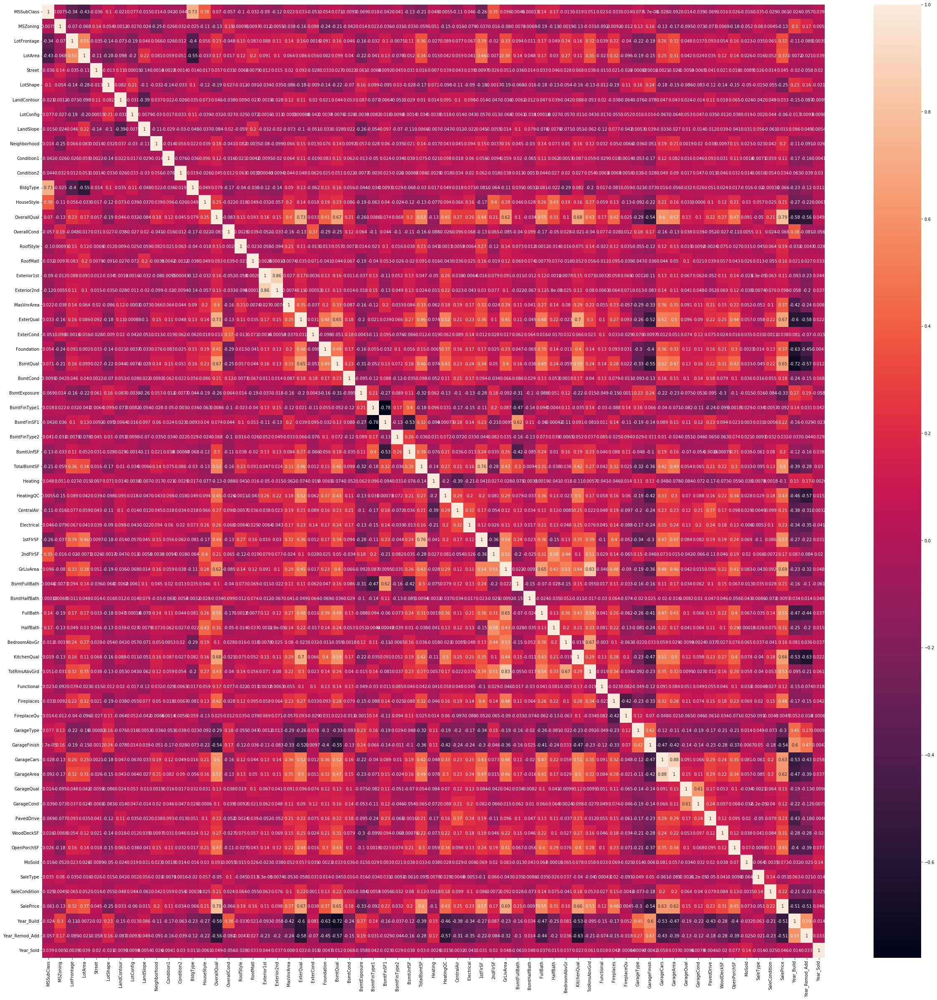

In [120]:
# Visualizing the correlation matrix using the heatmap
plt.figure(figsize=(42,42))
sns.heatmap(df_train.corr(),annot=True,linecolor='black')
plt.show()

In [121]:
# Checking the correlation of test data
df_test_corr=df_test.corr()
df_test_corr

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_Built,Year_Remod_Add,Year_Sold
MSSubClass,1.000000,0.266517,-0.454786,-0.559657,0.004588,0.031969,0.176681,0.068736,0.071784,-0.073979,-0.081962,0.042599,-0.036770,0.798007,0.455233,-0.116077,-0.068113,-0.183492,-0.019367,-0.103303,-0.202425,0.041990,-0.047717,-0.120495,0.072808,0.099330,0.016528,-0.000611,0.003453,-0.080689,0.043449,-0.196697,-0.336822,0.049709,-0.116916,-0.053192,0.075568,-0.390978,0.400684,0.030653,-0.000676,-0.041577,0.095903,0.210890,-0.061750,-0.134592,-0.031809,-0.075457,-0.074559,-0.083281,0.143455,0.059519,-0.086798,-0.122536,0.061413,0.025030,-0.024900,0.040682,-0.104641,-0.004079,-0.105307,-0.010155,-0.024612,0.023317,-0.044441
MSZoning,0.266517,1.000000,-0.335754,-0.335805,-0.063162,-0.037882,0.167716,-0.099137,0.055261,-0.035312,-0.204984,-0.059909,0.105995,0.230251,-0.068366,-0.276394,0.191126,-0.031210,-0.022604,-0.028611,-0.028994,-0.125356,-0.327079,0.065494,-0.195382,-0.219848,-0.139784,0.047561,0.038716,-0.140046,-0.015825,-0.140089,-0.270929,0.094397,-0.225763,-0.235065,-0.035888,-0.227152,0.017233,-0.211886,-0.084559,-0.017534,-0.236326,-0.181873,-0.104881,-0.266916,-0.153357,-0.131738,-0.169600,0.050584,0.142661,0.233188,-0.306561,-0.304614,-0.087401,-0.067022,-0.236680,-0.100888,-0.185326,0.074308,0.123993,0.005290,0.365869,0.159359,0.072716
LotFrontage,-0.454786,-0.335754,1.000000,0.623700,-0.056531,-0.100772,-0.147720,-0.086163,-0.124470,0.176406,0.184817,0.064350,-0.018887,-0.436593,-0.080950,0.254760,-0.096571,0.199222,0.077308,0.018168,0.035881,0.108944,0.185375,-0.072894,0.130965,0.162885,0.043670,-0.152784,-0.007482,0.097369,-0.115149,0.157696,0.398795,0.011852,0.098609,0.031703,0.020348,0.458767,-0.080395,0.348015,0.085464,-0.044632,0.227718,0.031989,0.227534,0.181377,0.330815,-0.002318,0.256905,0.000598,-0.239243,-0.303757,0.306181,0.317132,0.058944,0.033971,0.076602,0.020964,0.054913,-0.045333,0.034876,0.037168,-0.152912,-0.056610,-0.059745
LotArea,-0.559657,-0.335805,0.623700,1.000000,-0.099348,-0.074004,-0.294907,-0.139905,-0.150922,0.429145,0.184733,0.059812,-0.034579,-0.588876,-0.082811,0.217092,-0.099886,0.234422,0.035262,0.070080,0.090332,0.057879,0.165959,-0.025418,0.073686,0.113234,0.048353,-0.236008,0.003165,0.136856,-0.008923,0.113707,0.408620,0.059190,0.068964,0.060219,-0.001966,0.495823,-0.052562,0.397836,0.148346,0.067735,0.210105,0.066096,0.307383,0.137635,0.399155,0.047121,0.293361,0.023628,-0.205593,-0.245896,0.335243,0.350725,0.026787,-0.036731,-0.017594,0.098388,0.134890,-0.045307,0.076505,0.058346,-0.079597,-0.057241,-0.017708
Street,0.004588,-0.063162,-0.056531,-0.099348,1.000000,0.010961,-0.002444,0.153613,0.058229,-0.324146,-0.045972,-0.246714,0.004868,-0.028820,0.043073,0.066173,0.077702,-0.054925,0.006540,-0.021532,-0.019729,-0.015019,0.128016,0.024868,0.043091,0.009123,0.003768,0.192832,-0.037657,-0.038548,0.110019,0.095286,-0.029632,0.011782,0.060962,0.156680,-0.025961,-0.012989,0.072274,0.050722,-0.094062,0.021908,0.087362,-0.025380,0.030347,0.058313,0.067617,-0.018670,-0.027697,0.033426,0.006743,-0.029487,-0.084965,-0.117624,-0.006540,-0.007318,-0.023367,-0.002395,-0.019373,0.036965,-0.019125,-0.012345,-0.046874,-0.092244,0.040272
Alley,0.031969,-0.037882,-0.100772,-0.074004,0.010961,1.000000,0.098396,-0.073957,-0.058232,-0.029866,0.068663,-0.003796,-0.007737,0.024907,-0.014614,0.050818,0.0381

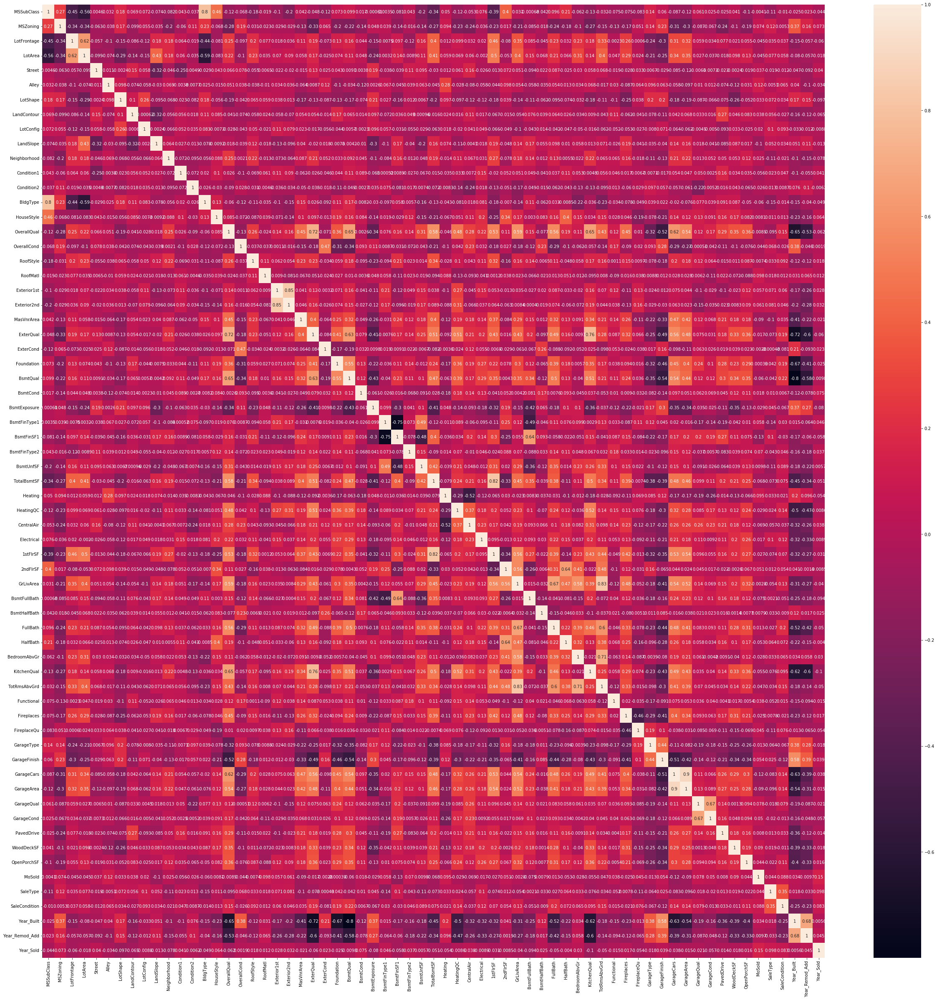

In [122]:
# Visualizing the correlation matrix using the heatmap
plt.figure(figsize=(42,42))
sns.heatmap(df_test.corr(),annot=True,linecolor='black')
plt.show()

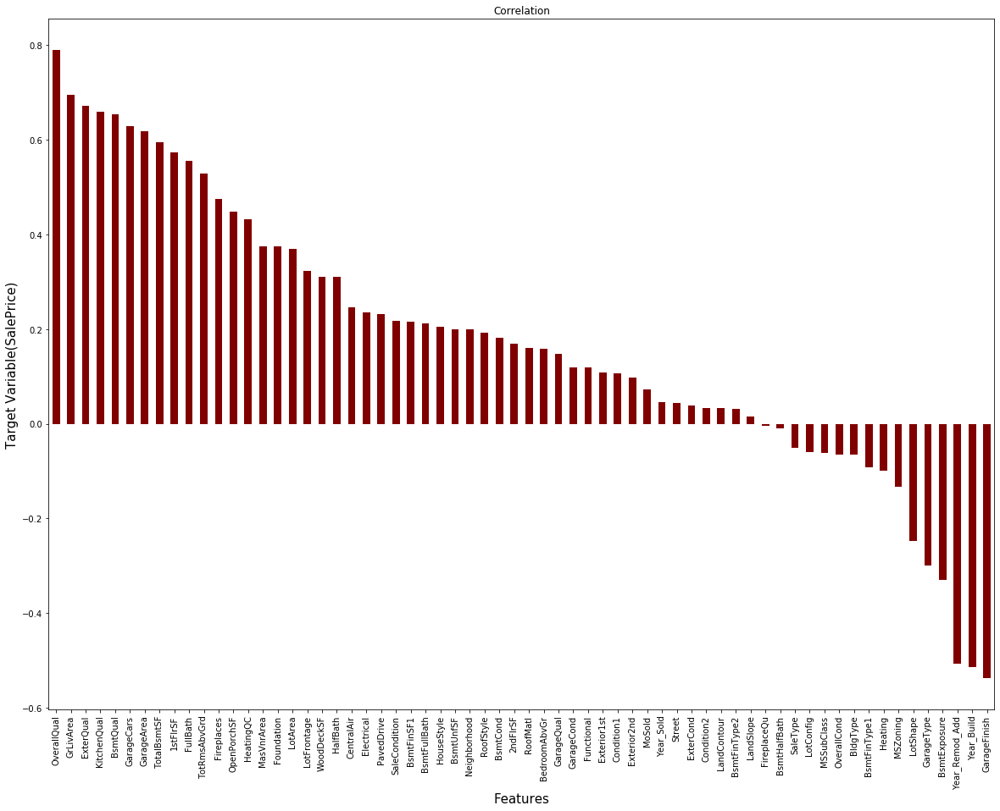

In [125]:
plt.figure(figsize=(20,15))
df_train.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='maroon')
plt.xlabel('Features',fontsize=15)
plt.ylabel('Target Variable(SalePrice)',fontsize=15)
plt.title('Correlation')
plt.show()

We see that OverallQual is highly correlated. FireplaceQu and BsmHalfBath is very less correlation with target variable.

# Splitting the data into x any y variable for training and testing the data.

In [127]:
x=df_train.drop('SalePrice',axis=1)

In [128]:
x.shape

(1168, 64)

In [129]:
y=df_train['SalePrice']

In [130]:
y.shape

(1168,)

# Scaling the data for train data

In [132]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [135]:
sc.fit_transform(x)

array([[ 1.50830058, -0.02164599,  0.        , ..., -0.16823612,
         0.42156533,  0.60548713],
       [-0.87704243, -0.02164599,  1.07063136, ...,  0.03088544,
         0.71035613,  0.60548713],
       [ 0.07709478, -0.02164599,  0.93686671, ..., -0.83197465,
        -0.58920245,  0.60548713],
       ...,
       [ 2.46243779, -0.02164599, -2.09513215, ..., -0.16823612,
         0.42156533, -0.8992128 ],
       [ 0.31562908, -4.76211672, -0.93583847, ...,  1.69023175,
         1.67299211, -0.14686284],
       [ 0.07709478, -0.02164599,  0.        , ..., -1.0310962 ,
        -0.87799325,  1.3578371 ]])

In [138]:
x=pd.DataFrame(sc.fit_transform(x),columns=x.columns)
x.head(5)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_Build,Year_Remod_Add,Year_Sold
0,1.508301,-0.021646,1.490436e-16,-1.213954,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.075169,-0.530217,-0.483544,-0.134573,-0.212927,-0.104890,-0.822734,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.638442,-1.523529,-0.112649,0.310141,0.903777,0.038239,-0.11909,-1.178317,0.267506,0.299036,-0.458345,-0.871745,-1.236502,-0.816112,-0.238775,0.793082,-0.782707,-1.082679,-0.788838,-0.965583,0.261146,0.777879,-1.163409,-0.693653,-0.288773,0.29985,-0.171944,0.101364,0.110393,0.291828,-0.959773,1.409990,-1.617822,0.330033,0.207932,-0.168236,0.421565,0.605487
1,-0.877042,-0.021646,1.070631e+00,1.100521,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.364138,0.359572,-1.685203,6.090408,1.079014,1.050880,-0.822734,1.032209,2.589114,0.852451,-0.832343,3.332324,-2.240709,-1.523529,0.394677,-0.771186,1.027313,2.614679,-0.11909,0.903792,0.267506,0.299036,2.122554,-0.871745,1.295050,1.101833,-0.238775,0.793082,-0.782707,1.365664,0.716657,0.911999,0.261146,0.777879,-1.163409,-0.693653,0.946709,0.29985,0.672371,0.101364,0.110393,0.291828,0.781991,1.414498,1.361470,0.330033,0.207932,0.030885,0.710356,0.605487
2,0.077095,-0.021646,9.368667e-01,0.158048,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.644484,-0.530217,-0.483544,-0.134573,-0.535912,-0.682775,-0.822734,1.032209,-0.223988,0.852451,0.647378,-0.037507,-1.280992,-0.434828,0.925416,0.310141,-0.504500,0.126458,-0.11909,0.903792,0.267506,0.299036,0.058641,1.176207,1.003880,1.101833,-0.238775,0.793082,1.268421,0.141492,-0.788838,0.911999,0.261146,0.777879,-1.163409,-0.693653,0.946709,0.29985,-0.101973,0.101364,0.110393,0.291828,1.043999,1.198911,-0.128176,0.330033,0.207932,-0.831975,-0.589202,0.605487
3,-0.877042,-0.021646,1.516514e+00,0.496002,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,0.359572,1.919773,-0.134573,-0.212927,-0.104890,1.382984,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.638442,-0.979178,0.797133,0.310141,1.160517,1.770946,-0.11909,0.903792,0.267506,0.299036,1.574554,-0.871745,0.739356,-0.816112,-0.238775,0.793082,-0.782707,0.141492,-0.788838,0.286138,0.261146,0.777879,-1.163409,-0.693653,-0.288773,0.29985,0.322517,0.101364,0.110393,0.291828,-0.959773,1.169545,-1.990233,-4.612004,0.207932,-0.201423,0.373434,-1.651563
4,-0.877042,-0.021646,1.490436e-16,1.196626,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,1.249361,-0.483544,-0.134573,-1.504868,-1.549602,1.138552,1.032209,-0.223988,-0.557836,0.647378,-0.037507,0.638442,-1.523529,1.176115,0.310141,-0.226633,1.223537,-0.11909,-0.137262,0.267506,0.299036,1.149105,-0.871745,0.314931,-0.816112,4.188040,0.793082,-0.782707,0.141492,0.716657,0.911999,0.261146,0.777879,-1.163409,-0.693653,-1.524255,0.29985,0.243217,0.101364,0.110393,0.291828,1.135369,-1.061392,-0.128176,0.330033,0.207932,-0.201423,-0.733598,-0.899213


# Scaling the data for test data

In [139]:
scaled=StandardScaler()

In [141]:
X=pd.DataFrame(scaled.fit_transform(df_test),columns=df_test.columns)
X.head(7)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_Built,Year_Remod_Add,Year_Sold
0,-0.856054,-0.287006,0.981605,0.842656,0.083045,-0.131991,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.846195,-0.078757,0.694397,0.733065,1.182923,1.137790,-0.299447,0.776109,2.077301,-0.045376,-2.322000,-0.377559,1.205140,0.296045,0.455087,2.074477,-0.141879,0.842032,0.248633,0.312609,1.814725,-0.870294,0.943726,1.132656,-0.263813,0.776457,-0.738058,0.254952,0.816613,0.961793,0.22482,0.808861,0.487877,-0.659455,-1.474589,1.687009,1.038573,0.078757,0.088121,0.281378,1.119038,0.718308,0.276960,0.23029,0.148654,-1.301385,-1.031595,0.650908
1,1.431981,-0.287006,0.000000,-0.739104,0.083045,-0.131991,-1.402669,0.299297,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.464603,-0.523427,-0.078757,-1.046066,-1.248926,-0.846534,1.137790,-0.299447,-0.518884,0.619196,-0.045376,-1.346426,-0.377559,1.064798,0.296045,-0.841820,0.418166,-0.141879,-0.208709,0.248633,0.312609,0.726749,-0.870294,-0.077517,1.132656,-0.263813,-1.051974,-0.738058,-2.226584,0.816613,-1.618327,0.22482,0.808861,2.268630,-0.659455,-0.254816,0.359228,0.511068,0.078757,0.088121,0.281378,0.813787,-1.111540,0.637997,-6.49418,-3.323909,-0.063464,0.064496,-0.863555
2,-0.856054,-0.287006,0.000000,0.524304,0.083045,-0.131991,0.745474,0.299297,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,1.846195,-0.078757,0.694397,0.733065,-0.846534,1.137790,-0.299447,0.776109,0.619196,-0.045376,-1.346426,1.284459,-1.375716,0.296045,2.127575,1.675735,-0.141879,0.842032,0.248633,0.312609,1.586900,-0.870294,0.729670,-0.836008,-0.263813,0.776457,-0.738058,0.254952,2.335408,0.447622,0.22482,0.808861,-1.292875,-0.659455,-0.254816,0.359228,0.306719,0.078757,0.088121,0.281378,1.153748,1.278346,-0.084077,0.23029,0.148654,-0.932033,-0.782483,-0.863555
3,0.287963,-0.287006,0.429998,0.548484,0.083045,-0.131991,0.745474,-3.998799,0.598774,-0.226274,-1.114572,-0.028763,-0.058621,-0.444642,1.011146,0.680468,1.419621,-0.523427,-0.078757,-0.610950,-0.588262,-0.846534,-0.648418,-0.299447,-0.518884,-0.838910,-0.045376,0.604722,0.730453,0.235689,0.296045,-0.093395,-0.799293,-0.141879,0.842032,0.248633,0.312609,-0.705442,1.137231,0.334155,-0.836008,-0.263813,-1.051974,1.349285,0.254952,-2.220978,0.447622,0.22482,0.808861,0.487877,-0.659455,0.964957,-0.968552,-1.061944,0.078757,0.088121,0.281378,-0.913570,-1.111540,0.276960,0.23029,0.148654,1.039378,1.758454,-0.863555
4,0.059160,-0.287006,0.981605,0.897263,0.083045,-0.131991,-1.402669,0.299297,-1.351136,-0.226274,1.387645,-1.228602,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,-0.523427,-0.078757,0.694397,0.733065,0.952580,1.137790,-0.299447,0.776109,0.619196,-0.045376,-0.370852,1.284459,-1.375716,0.296045,0.870427,-0.351004,-0.141879,0.842032,0.248633,0.312609,-0.584696,1.211129,0.960645,-0.836008,-0.263813,0.776457,1.349285,1.495721,0.816613,1.420534,0.22482,0.808861,0.487877,0.497067,-1.474589,1.687009,1.000555,0.078757,0.088121,0.281378,0.954066,0.218396,-1.889261,0.23029,0.148654,-1.570975,-1.081417,-0.106324
5,2.804802,1.808136,-2.277892,-2.686724,0.083045,-0.131991,0.745474,0.299297,0.598774,-0.226274,-0.447314,-0.028763,-0.058621,1.930397,1.521085,-1.535479,0.477509,-0.523427,-0.078757,-1.481182,-1.579258,-0.846534,-0.648418,-0.

# Variation Inflation Factor for train data

In [143]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [145]:
vif=pd.DataFrame()
vif['Feature']=x.columns
vif['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
vif

,Feature,VIF
0,MSSubClass,5.092662
1,MSZoning,1.361671
2,LotFrontage,1.786467
3,LotArea,2.762067
4,Street,1.118692
5,LotShape,1.292800
6,LandContour,1.345247
7,LotConfig,1.145275
8,LandSlope,1.514279
9,Neighborhood,1.232047


Variance Inflation Factor is high in GrLivArea. Let's drop that column

In [146]:
x=x.drop('GrLivArea',axis=1)

In [147]:
vif=pd.DataFrame()
vif['Feature']=x.columns
vif['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
vif

,Feature,VIF
0,MSSubClass,5.089073
1,MSZoning,1.361555
2,LotFrontage,1.786208
3,LotArea,2.760989
4,Street,1.112839
5,LotShape,1.290515
6,LandContour,1.344895
7,LotConfig,1.144700
8,LandSlope,1.511878
9,Neighborhood,1.231052


Variance Inflation Factor has been removed after the GrLivArea column has dropped from train dataset. There is no multicollinearity exist.

In [148]:
# Variation Inflation Factor for test data

vif=pd.DataFrame()
vif['Features']=X.columns
vif['VIF']=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
vif

,Features,VIF
0,MSSubClass,13.875913
1,MSZoning,1.915294
2,LotFrontage,2.308170
3,LotArea,4.386995
4,Street,1.543030
5,Alley,1.450954
6,LotShape,1.683137
7,LandContour,1.611777
8,LotConfig,1.354027
9,LandSlope,2.193801


There is high variance inflation factor in GrLivArea. Let's drop that column.

In [149]:
X=X.drop('GrLivArea',axis=1)

In [150]:
vif=pd.DataFrame()
vif['Features']=X.columns
vif['VIF']=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
vif

,Features,VIF
0,MSSubClass,13.839568
1,MSZoning,1.914985
2,LotFrontage,2.275301
3,LotArea,4.386157
4,Street,1.537862
5,Alley,1.428900
6,LotShape,1.680352
7,LandContour,1.611540
8,LotConfig,1.351840
9,LandSlope,2.193473


We have removed the multicollinearity in both train and test data.

# Model Building

In [152]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import AdaBoostRegressor

In [155]:
max_accu=0
max_RS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=.30)
    rf=RandomForestRegressor()
    rf.fit(x_train,y_train)
    mod=rf.predict(x_test)
    score=r2_score(y_test,mod)
    if score>max_accu:
        max_accu=score
        max_RS=i
print("Best Accuracy score is:",max_accu,"On Random State:",max_RS)

Best Accuracy score is: 0.9008140205013233 On Random State: 135


# Linear Regression

In [156]:
lr=LinearRegression()
lr.fit(x_train,y_train)

LinearRegression()

In [158]:
lr_pred=lr.predict(x_test)
print("Predicted value:\n",lr_pred)

Predicted value:
 [197736.56559146 249294.74186195 193246.34721039 321839.9727739
 128488.29387499 106465.15177409 286020.56548735 154966.0190152
 375931.58478799 111843.27014291 192174.64329661 217177.81029334
 170788.36734562 293792.11660731 223383.25361447 136336.70951218
  39930.04103969  53902.84974882 267503.81091609 372331.08097173
  63126.19506203 152965.63628185 297502.24202837 294981.59277159
 183947.84648778 217727.63637626 188848.11017353 140135.86511833
 173343.17059482 198635.89648077 131847.65700603 209298.98981208
 210007.3734249  291285.00887271 314212.55287704 137395.29110173
 272849.26905963 240356.44547428 137981.851633    68378.95731378
 242318.45098066  90076.08728668 214280.74129545 167325.95914598
 204613.75233969 201285.93631831 171015.6314875  222308.29982145
 124859.26209086 224045.50775131 217242.14418549  96217.74156939
 138770.66342514 240881.49115869 339287.13329926 240250.96124394
 168469.27262652 159008.14259471 130202.961763   101234.25494064
 136981.5

In [161]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

print("R2 Score value is:",r2_score(y_test,lr_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,lr_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,lr_pred))

R2 Score value is: 0.7798773656305659
Mean Squared Error value is: 1421966718.20338
Mean Absolute Error value is: 24124.668990447943


# Random Forest Regressor

In [162]:
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)

RandomForestRegressor()

In [163]:
rfr_pred=rfr.predict(x_test)
print("Predicted value:\n",rfr_pred)

Predicted value:
 [176587.07 200186.93 162412.   357061.73 132671.21 113739.92 290301.08
 132005.02 362927.94 118134.99 144880.04 192351.35 138703.23 301973.26
 207412.42 146445.    98895.66  92629.61 287833.01 478394.89 104518.38
 129722.3  262026.78 288310.92 192106.17 218583.58 200119.87 128160.82
 171333.5  187008.99 116899.32 188315.36 193108.   300752.65 226069.63
 129465.04 297609.17 226076.75 137293.1  107784.78 268680.07 121857.61
 209950.99 137796.39 188421.4  191652.15 179051.84 234209.84 121267.48
 190783.02 156550.5  102113.57 134037.34 157893.5  411315.04 206805.61
 159893.59 168955.1  142833.5  104370.34 129275.48 129846.16 143224.37
 143381.92 153799.72 159548.62 145837.   195127.16 147911.54 132200.16
 222902.18 295454.58 144798.37 223321.49 169624.5  164224.51  73682.25
 220460.84 310238.07  93507.88 119740.19 115703.1  156133.5  137109.8
 156936.12 399359.32 209658.52 212121.2  143897.   266258.16  65460.73
 201191.05 109675.22 132678.75 184440.3  117191.13 149746.91

In [164]:
print("R2 Score value is:",r2_score(y_test,rfr_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,rfr_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,rfr_pred))

R2 Score value is: 0.8657195622421776
Mean Squared Error value is: 867436072.3711108
Mean Absolute Error value is: 19138.336153846154


# KNeighborsRegressor

In [166]:
knn=KNeighborsRegressor()
knn.fit(x_train,y_train)

KNeighborsRegressor()

In [167]:
knn_pred=knn.predict(x_test)
print("Predicted value:\n",knn_pred)

Predicted value:
 [189206.8 190480.  156800.  333680.  132100.  127950.  303000.  123780.
 329350.  125600.  143590.  190600.  148500.  271980.  218700.  136730.
 108574.2  88000.  228300.  382270.4  94400.  119500.  234800.  187880.
 145246.4 221600.  186000.  147700.  183300.  175794.4  90700.  187361.4
 166900.  295160.  226200.  133680.  282750.  230400.  125300.  123340.
 232861.6 102400.  204480.  159180.  203500.  190600.  200698.  202080.
 130200.  203200.  135000.  110040.  132892.  242700.  386246.2 252800.
 174570.  151030.  136390.  118400.  137200.  137900.  140980.  124460.
 136380.  155080.  156080.  202446.  145350.  130500.  214300.  311283.8
 173020.  199800.  182500.  182580.  100300.  258900.  251380.  114680.
 128080.  135160.  138300.  137180.  158400.  419702.2 233200.  176700.
 156080.  254660.   82070.  194700.  113800.  118580.  195008.  132800.
 174780.  147200.  177300.  138300.  247184.4  98300.  307233.6 252850.
 142280.  244900.  225780.  157020.  179400.

In [168]:
print("R2 Score value is:",r2_score(y_test,knn_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,knn_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,knn_pred))

R2 Score value is: 0.7789691007255608
Mean Squared Error value is: 1427834004.2729344
Mean Absolute Error value is: 24478.465527065528


# Gradient Boosting Regressor

In [170]:
gbr=GradientBoostingRegressor()
gbr.fit(x_train,y_train)

GradientBoostingRegressor()

In [171]:
gbr_pred=gbr.predict(x_test)
print("Predicted value:\n",gbr_pred)

Predicted value:
 [176075.71075916 220957.63565232 175769.39315233 363389.45167771
 138711.4831092  100124.45548105 302608.55015041 147265.5700214
 346468.81760252 122335.50820676 145889.05594768 192038.99218882
 155022.59364405 293449.66822354 201864.15112514 137839.96775342
  94068.54465205  93775.11995082 274124.34180531 500123.89795447
  93189.74093773 128647.27406067 258960.28185004 288132.22014818
 194821.6676582  208029.79421911 193967.39774945 137873.08633426
 172411.21348587 177076.48397734 120076.36104106 193114.61217006
 196926.04111729 311055.6138794  212943.00798134 126255.17652905
 297546.72825268 248323.07267694 130416.72696252 112339.38010424
 274843.03565614 107076.22469856 215867.26904319 150478.09300453
 187137.40154308 195900.15517828 177810.11243452 232653.3288739
 118833.97739155 184472.7328636  180953.10368919  93230.77227839
 127573.52469334 154273.07169442 449458.32463427 206437.19502186
 149765.84405522 145791.52479135 138282.05512707 102801.89987262
 122286.3

In [172]:
print("R2 Score value is:",r2_score(y_test,gbr_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,gbr_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,gbr_pred))

R2 Score value is: 0.8568908538535339
Mean Squared Error value is: 924468505.8113929
Mean Absolute Error value is: 18584.143961828326


# Ada Boost Regressor

In [173]:
ada=AdaBoostRegressor()
ada.fit(x_train,y_train)

AdaBoostRegressor()

In [174]:
ada_pred=ada.predict(x_test)
print("Predicted values:\n",ada_pred)

Predicted values:
 [199882.29411765 209207.70258621 189506.1627907  333225.09649123
 130820.31343284 116537.05714286 308672.37222222 137117.30120482
 356850.61538462 125627.21568627 130820.31343284 199882.29411765
 140013.01470588 317986.26605505 201985.94736842 130820.31343284
 126009.10810811 124168.6        241211.17391304 497321.82352941
 125627.21568627 130820.31343284 294162.94949495 282571.94495413
 203804.35714286 209461.5158371  192195.51515152 127713.88034188
 183021.61052632 201985.94736842 152829.03755869 209207.70258621
 200817.57916667 314097.83392226 235392.02040816 129471.93987342
 320689.69747899 209461.5158371  133943.27169811 124168.6
 316594.57272727 129471.93987342 208765.10416667 153654.15025907
 201985.94736842 199882.29411765 203898.14720812 213810.09793814
 124562.21323529 200817.57916667 189506.1627907  117032.21167883
 137117.30120482 152829.03755869 468228.98583569 226771.74561404
 153654.15025907 167760.2516129  126009.10810811 128592.92857143
 133943.27169

In [175]:
print("R2 Score value is:",r2_score(y_test,ada_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,ada_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,ada_pred))

R2 Score value is: 0.7803799398530608
Mean Squared Error value is: 1418720146.946127
Mean Absolute Error value is: 27886.92022642047


# Decision Tree Regressor

In [176]:
dtc=DecisionTreeRegressor()
dtc.fit(x_train,y_train)

DecisionTreeRegressor()

In [177]:
dtc_pred=dtc.predict(x_test)
print("Predicted value:\n",dtc_pred)

Predicted value:
 [130500. 194500. 155000. 369900. 119000. 123000. 290000. 118400. 466500.
 123000. 169500. 226000. 128500. 315500. 133900. 162000. 129000.  75500.
 315750. 402861. 106500.  60000. 212000. 309000. 172500. 219500. 200500.
 134500. 173000. 191000. 100000. 187500. 171000. 252000. 227000. 128000.
 239000. 228500. 256000. 131000. 394617. 122500. 198900. 132000. 228500.
 185000. 202500. 214000. 130000. 187500. 139900.  55000. 130000. 180000.
 320000. 178400. 178000. 214500. 153000. 106000. 127000. 114504. 145000.
 126175. 148000. 153500. 140000. 175500. 175000. 136500. 214000. 275000.
 135000. 231500. 158000. 259500.  78000. 171000. 320000. 107500. 127000.
 119500. 143250. 132500. 157900. 501837. 194000. 216500. 140000. 255900.
  60000. 231500. 130000. 150000. 162000. 129000. 124000. 141000. 235000.
 150000. 258000.  75500. 284000. 277000. 116000. 241500. 189000. 173000.
 176000. 169900. 259500. 189000.  34900. 118400. 187500. 139000. 263435.
 122000. 109900. 102776. 301000. 

In [178]:
print("R2 Score value is:",r2_score(y_test,dtc_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,dtc_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,dtc_pred))

R2 Score value is: 0.7218954002902283
Mean Squared Error value is: 1796523497.4558403
Mean Absolute Error value is: 28408.344729344728


# Support Vector Regressor

In [194]:
svr=SVR(kernel='linear')
svr.fit(x_train,y_train)

SVR(kernel='linear')

In [195]:
svr_pred=svr.predict(x_test)
print("Predicted values:\n",svr_pred)

Predicted values:
 [169760.26409686 171932.60072591 166260.67067468 175734.12579411
 160625.61503577 157591.32889942 174466.82469013 159974.4304372
 178145.71797139 159558.09090299 161692.6398568  166391.15033538
 162060.10774514 174656.17946907 170632.58272451 161198.60978534
 155734.82147147 156881.42284905 172411.53623729 180299.92836804
 158764.82340242 159597.89436536 170704.8966358  172829.00109791
 165918.41520137 169429.19623281 165859.87131762 161450.02096451
 166152.51216765 169161.12360041 158044.23646036 170021.87511267
 166204.14237922 174868.34567567 169664.75872544 158347.47890543
 173855.31096758 169001.66272392 160588.38478587 155794.71149698
 172989.55311087 159515.24265895 171008.58078281 164753.71906243
 166725.12214953 166426.75169544 168752.12377157 171110.4666158
 158903.9549157  169947.70653464 163739.01586261 157561.06987105
 161627.54769715 165123.42892688 177987.89886045 170267.16927184
 165459.95427248 162353.14755042 159613.14770806 154964.94772453
 162051.

In [196]:
print("R2 Score value is:",r2_score(y_test,svr_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,svr_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,svr_pred))

R2 Score value is: 0.08078556628743161
Mean Squared Error value is: 5938018756.570634
Mean Absolute Error value is: 51766.304609052444


# Bagging Regressor

In [197]:
br=BaggingRegressor()
br.fit(x_train,y_train)

BaggingRegressor()

In [198]:
br_pred=br.predict(x_test)
print("Predicted values:\n",br_pred)

Predicted values:
 [173787.2 215650.  164795.  315157.6 122429.3  93416.6 294272.  138440.
 387765.7 120108.3 149980.  179470.  132740.  292781.3 199550.  145700.
 107288.6  88050.  303675.9 530224.6 113500.  143100.  262530.  281623.
 197695.  209070.  202440.  130660.  170425.  187335.  110422.6 191059.8
 214130.  294672.4 238380.  131850.4 299075.  236215.  149450.  107994.2
 276066.8 128945.3 207526.2 138490.  185820.  185580.  183504.8 239600.
 135065.  200757.8 150480.   98056.9 135422.  161640.  463033.6 215675.
 148640.  165900.  136950.  108390.  133030.  128330.  144740.  142045.
 150550.  153680.  147660.  192547.  146495.  136200.  212914.1 311151.9
 143615.  193420.  169790.  151380.   82250.  230200.  365487.1  85790.
 119239.3 106940.  149750.  143090.  148800.  436499.7 213670.  231722.
 140980.  265575.   66431.1 206680.  108398.6 122140.  202923.5 116790.
 131440.  140462.5 241060.  147945.  256950.   88800.  246303.4 215127.8
 154600.  242105.  261140.  156460.  1879

In [199]:
print("R2 Score value is:",r2_score(y_test,br_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,br_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,br_pred))

R2 Score value is: 0.8122389024038115
Mean Squared Error value is: 1212914939.528775
Mean Absolute Error value is: 22090.98803418803


# XGB Regressor

In [200]:
xgb=XGBRegressor()
xgb.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [201]:
xgb_pred=xgb.predict(x_test)
print("Predicted value:\n",xgb_pred)

Predicted value:
 [168849.97  192104.1   178761.34  375651.97  140505.61  114434.04
 309540.97  131902.53  376556.28  113795.99  162253.17  180430.62
 140765.53  315442.75  209758.27  151156.52  106864.72   72694.77
 274881.9   517714.47   79749.6   113269.484 294228.4   258598.33
 224377.44  224266.36  201738.5   166252.22  181317.36  182525.66
 105701.26  188321.12  205906.38  295563.28  205207.33  125954.95
 319680.16  221248.83  140979.83  123467.05  265085.4   114833.96
 210509.03  153390.9   190446.53  196391.7   164887.75  224021.67
 132199.48  185858.4   157513.81  105233.91  126180.95  144561.94
 453066.16  212325.14  160456.33  157274.19  148156.81  101819.86
 122897.18  126402.59  135586.05  147508.11  152965.27  166445.73
 145300.12  189790.84  129968.58  134200.44  219690.53  267394.3
 139157.53  235171.62  170685.83  178195.75   66611.42  234088.77
 318514.7    83137.11  109517.055  83413.1   141385.08  139938.16
 173301.06  404208.3   207820.62  186826.38  147070.9   249

In [202]:
print("R2 Score value is:",r2_score(y_test,xgb_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,xgb_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,xgb_pred))

R2 Score value is: 0.8384264332020065
Mean Squared Error value is: 1043746524.233223
Mean Absolute Error value is: 19911.45108840812


# SGD Regressor

In [203]:
sgd=SGDRegressor()
sgd.fit(x_train,y_train)

SGDRegressor()

In [204]:
sgd_pred=sgd.predict(x_test)
print("Predicted value:\n",sgd_pred)

Predicted value:
 [197572.47317706 247435.31525092 191885.75106716 317218.51146435
 129456.05181928 106624.53615252 282055.50264993 155460.06559361
 371595.43145486 113634.95967335 192731.66878012 216336.01453859
 169527.79445602 292050.45999948 223136.60939363 137859.47694124
  43160.57661003  57517.82594886 262925.52611838 367122.25705867
  65429.18622048 155142.29222928 294145.03040609 284188.74165081
 183656.71507029 217250.15328167 185667.06516366 141503.49564831
 171868.79380863 199392.45863805 135741.02442198 209848.57703625
 210575.34470621 288075.84550904 303173.99892424 139454.45587824
 270536.61593337 237842.47752559 138735.05063331  71168.20309321
 240310.40479967  91772.02048771 212288.06029023 165130.7569225
 202819.92490662 200110.71931091 174141.64166673 222106.18529338
 126991.37720656 224946.57989756 217914.14942013  97993.08088528
 138102.25780451 232050.69362206 333866.5019602  238195.77585868
 169180.11309761 160408.08433318 131188.64237437 103343.5988554
 137264.0

In [205]:
print("R2 Score value is:",r2_score(y_test,sgd_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,sgd_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,sgd_pred))

R2 Score value is: 0.7801488261569428
Mean Squared Error value is: 1420213114.6499805
Mean Absolute Error value is: 23899.344289807395


# Extra Tree Regressor

In [238]:
from sklearn.tree import ExtraTreeRegressor

etr=ExtraTreeRegressor()
etr.fit(x_train,y_train)

ExtraTreeRegressor()

In [239]:
etr_pred=etr.predict(x_test)
print("Predicted values:\n",etr_pred)

Predicted values:
 [200141. 200000. 219500. 369900. 117000. 127000. 290000. 112000. 475000.
 137000. 125500. 190000. 163500. 377500. 142500. 180500.  85000.  75500.
 226000. 556581.  66500. 112000. 270000. 307000. 159000. 227000. 257500.
 137000. 180000. 168500. 131500. 200141. 192000. 255500. 112000. 147000.
 297000. 252678. 125000. 100000. 255000. 152000. 215200. 169500. 205000.
 192000. 180000. 219500. 130000. 177500. 161000.  88000. 125000. 176000.
 385000. 287000. 165000. 110000. 127000.  78000. 129500. 141000. 139000.
 147000. 188000. 112500. 144500. 192000. 125000. 144000. 240000. 255000.
 135500. 230000. 155000. 124000.  78000. 250000. 227680. 130500. 127000.
 274725. 173000. 139000. 161000. 385000. 237000. 325000. 155900. 241000.
  78000. 195000. 139600. 133000. 179540. 145000. 153000. 153000. 320000.
 144000. 307000.  75500. 325000. 208300. 166000. 242000. 270000. 125000.
 252678. 152000. 205000. 142500.  78000. 127000. 177000. 176000. 307000.
  93500. 131500. 124500. 205000.

In [240]:
print("R2 Score value is:",r2_score(y_test,etr_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,etr_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,etr_pred))

R2 Score value is: 0.7080055438541986
Mean Squared Error value is: 1886250360.980057
Mean Absolute Error value is: 30604.222222222223


In [241]:
for rg in (lr,dtc,rfr,gbr,ada,xgb,sgd,svr,knn,etr):
    rg.fit(x_train,y_train)
    rg_pred=rg.predict(x_test)
    print(rg.__class__.__name__,r2_score(y_test,rg_pred)*100)

LinearRegression 77.98773656305659
DecisionTreeRegressor 62.74849987912632
RandomForestRegressor 85.63463073292343
GradientBoostingRegressor 85.78587888555234
AdaBoostRegressor 78.32105288015946
XGBRegressor 83.84264332020065
SGDRegressor 77.78613951349017
SVR 8.078556628743161
KNeighborsRegressor 77.89691007255608
ExtraTreeRegressor 67.37200144535403


Gradient Boosting Regressor gives a good score 86%

# Cross Validation Score

In [242]:
print("Cross Validation Score for Linear Regression is:",cross_val_score(lr,x,y,cv=10).mean()*100)
print("Cross Validation Score for Decision Tree Regressor is:",cross_val_score(dtc,x,y,cv=10).mean()*100)
print("Cross Validation Score for Random Forest Regressor is:",cross_val_score(rfr,x,y,cv=10).mean()*100)
print("Cross Validation Score for Gradient Boosting Regressor is:",cross_val_score(gbr,x,y,cv=10).mean()*100)
print("Cross Validation Score for Ada Boost Regressor is:",cross_val_score(ada,x,y,cv=10).mean()*100)
print("Cross Validation Score for KNeighbors Regressor is:",cross_val_score(knn,x,y,cv=10).mean()*100)
print("Cross Validation Score for Support Vector Regressor is:",cross_val_score(svr,x,y,cv=10).mean()*100)
print("Cross Validation Score for XGB Regressor is:",cross_val_score(xgb,x,y,cv=10).mean()*100)
print("Cross Validation Score for SGD Regressor is:",cross_val_score(sgd,x,y,cv=10).mean()*100)

Cross Validation Score for Linear Regression is: 77.14564376165815
Cross Validation Score for Decision Tree Regressor is: 65.82174005922823
Cross Validation Score for Random Forest Regressor is: 83.81729275921984
Cross Validation Score for Gradient Boosting Regressor is: 83.87671632260538
Cross Validation Score for Ada Boost Regressor is: 77.05790718695312
Cross Validation Score for KNeighbors Regressor is: 74.17921365976
Cross Validation Score for Support Vector Regressor is: 10.190583912029023
Cross Validation Score for XGB Regressor is: 82.23367062787655
Cross Validation Score for SGD Regressor is: 77.13040463440848


In Cross Validation Score Gradient Boosting Regressor gives a good score 84%. We will consider Gradient Boosting Regressor as our final model, as it gives a good score. Let's do the hyper parameter tuning to increase the accuracy.

# Hyper Parameter Tuning

In [243]:
params={'criterion':['mse','mae'],
       'n_estimators':[100,150],
       'learning_rate':[0.001,0.01,1.0],
       'random_state':[19],
       'max_depth':[5,10]}

In [219]:
from sklearn.model_selection import GridSearchCV

In [244]:
grid_param=GridSearchCV(estimator=gbr,cv=3,param_grid=params)

In [245]:
grid_param.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=GradientBoostingRegressor(),
             param_grid={'criterion': ['mse', 'mae'],
                         'learning_rate': [0.001, 0.01, 1.0],
                         'max_depth': [5, 10], 'n_estimators': [100, 150],
                         'random_state': [19]})

In [246]:
grid_param.best_params_

{'criterion': 'mse',
 'learning_rate': 0.01,
 'max_depth': 5,
 'n_estimators': 150,
 'random_state': 19}

In [247]:
grid_param.best_estimator_

GradientBoostingRegressor(criterion='mse', learning_rate=0.01, max_depth=5,
                          n_estimators=150, random_state=19)

In [248]:
grid_param.best_score_

0.769957334352636

#  Final Model

In [253]:
final_model=GradientBoostingRegressor(criterion='mse', learning_rate=0.01, max_depth=5,n_estimators=150, random_state=190)

In [254]:
final_model.fit(x_train,y_train)

GradientBoostingRegressor(criterion='mse', learning_rate=0.01, max_depth=5,
                          n_estimators=150, random_state=190)

In [255]:
final_model_pred=final_model.predict(x_test)
print("Predicted values:\n",final_model_pred)

Predicted values:
 [178074.70959869 206002.386154   168672.38783045 315196.64112572
 140715.24784453 129596.07699918 263226.96724117 146916.21740122
 314980.31946146 135185.25451054 155815.4717295  194001.60413737
 148378.10984087 280271.8227247  192181.36720497 157726.8057918
 121464.80268386 117259.83705646 271063.72092675 439706.80947184
 126634.07904198 137186.15712701 245995.55828063 273805.23638646
 186112.71032102 196925.62934033 191917.39202865 141659.45294871
 177036.31642894 187821.62647433 137184.95946153 192961.07278115
 191408.16589977 260475.10369801 213278.31642167 149994.97533838
 273811.65877487 212831.12359211 146969.2783476  135870.25814633
 262315.23253603 135996.21435584 190943.03298436 154131.30908511
 188540.73565883 191018.27921128 189886.49787448 218285.10878812
 135539.66498052 182658.6836234  167345.05196745 123071.59637362
 138519.46098124 161153.76371043 351813.13852585 193059.15625316
 168555.78228176 169568.4494542  145722.90265643 128497.65459636
 139351

In [256]:
print("R2 Score value is:",r2_score(y_test,final_model_pred))
print("Mean Squared Error value is:",mean_squared_error(y_test,final_model_pred))
print("Mean Absolute Error value is:",mean_absolute_error(y_test,final_model_pred))

R2 Score value is: 0.7950755785962432
Mean Squared Error value is: 1323788023.0625176
Mean Absolute Error value is: 24163.878115537846


After tuning the model accuracy didn't increase

# Saving the Model

In [257]:
import pickle

In [260]:
file_name="house_price_prediction.pickle"

In [261]:
pickle.dump(final_model,open(file_name,'wb'))

In [265]:
loaded_model=pickle.load(open(file_name,'rb'))
loaded_model_pred=loaded_model.predict(x_test)
loaded_model_pred

array([178074.70959869, 206002.386154  , 168672.38783045, 315196.64112572,
       140715.24784453, 129596.07699918, 263226.96724117, 146916.21740122,
       314980.31946146, 135185.25451054, 155815.4717295 , 194001.60413737,
       148378.10984087, 280271.8227247 , 192181.36720497, 157726.8057918 ,
       121464.80268386, 117259.83705646, 271063.72092675, 439706.80947184,
       126634.07904198, 137186.15712701, 245995.55828063, 273805.23638646,
       186112.71032102, 196925.62934033, 191917.39202865, 141659.45294871,
       177036.31642894, 187821.62647433, 137184.95946153, 192961.07278115,
       191408.16589977, 260475.10369801, 213278.31642167, 149994.97533838,
       273811.65877487, 212831.12359211, 146969.2783476 , 135870.25814633,
       262315.23253603, 135996.21435584, 190943.03298436, 154131.30908511,
       188540.73565883, 191018.27921128, 189886.49787448, 218285.10878812,
       135539.66498052, 182658.6836234 , 167345.05196745, 123071.59637362,
       138519.46098124, 1

In [264]:
df=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['Predicted','Acutal'])
df.T

,Predicted,Acutal
0,178074.709599,169990.0
1,206002.386154,184000.0
2,168672.387830,158000.0
3,315196.641126,440000.0
4,140715.247845,132000.0
5,129596.076999,118500.0
6,263226.967241,341000.0
7,146916.217401,139500.0
8,314980.319461,310000.0
9,135185.254511,130000.0


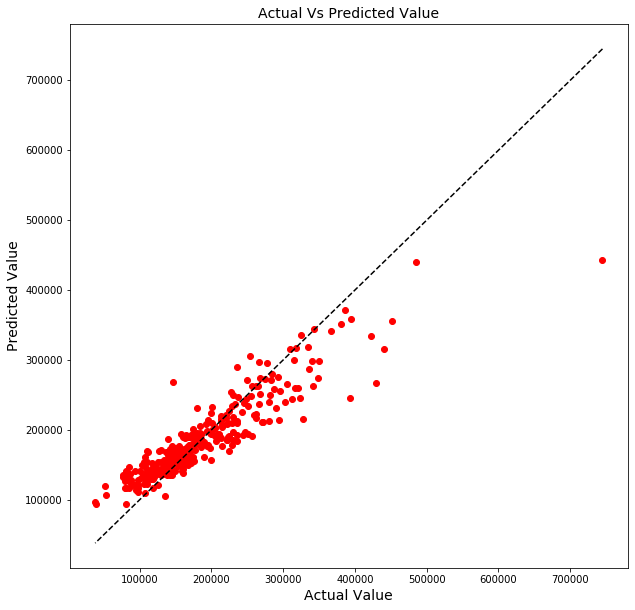

In [272]:
plt.figure(figsize=(10,10))
plt.scatter(y_test,loaded_model_pred,color='red')
p1=max(max(loaded_model_pred),max(y_test))
p2=min(min(loaded_model_pred),min(y_test))
plt.plot([p1,p2],[p1,p2],color='black',linestyle='--')
plt.xlabel("Actual Value",fontsize=14)
plt.ylabel("Predicted Value",fontsize=14)
plt.title("Actual Vs Predicted Value",fontsize=14)
plt.show()

Plotted the Acutal and Predicted the House SalesPrice using the Scatterplot

In [275]:
df.to_csv('Predicted_House_SalePrice.csv')

Saved the Predicted and Actual Sales Price of House.